In [1]:
cd /deac/phy/salsburyGrp/wud18/md/TM_mutant/pca/

/deac/phy/salsburyGrp/wud18/md/TM_mutant/pca


In [2]:
import pyemma
pyemma.__version__

'2.5.6'

In [3]:
import os
%pylab inline
matplotlib.rcParams.update({'font.size': 18})
pylab.rcParams['figure.figsize'] = (14, 11)
cwd = os.getcwd()

Populating the interactive namespace from numpy and matplotlib


In [4]:
import pyemma.coordinates as coor
import pyemma.msm as msm
import pyemma.plots as mplt
from pyemma import config
import mdtraj as md
import hdbscan
import seaborn as sns
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
sns.set_style("ticks",{"xtick.direction": "in","ytick.direction": "in"})

/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/pyemma/__init__.py:92: UserWarning: You are not using the latest release of PyEMMA. Latest is 2.5.7, you have 2.5.6.
  .format(latest=latest, current=current), category=UserWarning)


In [5]:
def plot_free_energy(X,variance,comp1,comp2,type1,type2,type3,type4,vmin,vmax,title,outname):
    cmap = plt.cm.get_cmap("nipy_spectral")    
    cmap.set_bad('white',1.)
    z,x,y = np.histogram2d(X[:,comp1],X[:,comp2], bins=50)
    x = 0.5*(x[:-1] + x[1:])
    y = 0.5*(y[:-1] + y[1:])
    overal_bound = [x[0], x[-1], y[0], y[-1]]
    xLabelName='PC{0} ({1:.2f}%)'.format(comp1+1, variance[comp1] * 100)
    yLabelName='PC{0} ({1:.2f}%)'.format(comp2+1, variance[comp2] * 100)

    fig,ax=plt.subplots(2,2,figsize=(14,10))
    fig.tight_layout(pad=0.1)
    ax=ax.flatten()

    z,x,y = np.histogram2d(X[type1,comp1],X[type1,comp2], bins=50)
    x = 0.5*(x[:-1] + x[1:])
    y = 0.5*(y[:-1] + y[1:])
    extent=[x[0], x[-1], y[0], y[-1]]
    F1 = -np.log(z)
    F1 -= np.min(F1)
    F1[np.where(F1==np.inf)]=np.nan    
    ax0=ax[0].contourf(F1.T, 100, cmap=cmap, extent=extent, vmin=vmin, vmax=vmax)
    ax[0].tick_params(labelsize=18, labelbottom=None)
    #ax[0].set_xlabel(xLabelName, fontsize=20)
    ax[0].set_ylabel(yLabelName, fontsize=20)
    ax[0].set_title(title + ' (WT)', fontsize=20)
    ax[0].set_xlim(overal_bound[0],overal_bound[1])
    ax[0].set_ylim(overal_bound[2],overal_bound[3])

    z,x,y = np.histogram2d(X[type2,comp1],X[type2,comp2], bins=50)
    x = 0.5*(x[:-1] + x[1:])
    y = 0.5*(y[:-1] + y[1:])
    extent=[x[0], x[-1], y[0], y[-1]]
    F2 = -np.log(z)
    F2 -= np.min(F2)
    F2[np.where(F2==np.inf)]=np.nan  
    ax1=ax[1].contourf(F2.T, 100, cmap=cmap, extent=extent, vmin=vmin, vmax=vmax)
    ax[1].tick_params(labelsize=18, labelleft=None, labelbottom=None)
    ax[1].set_ylabel(xLabelName, fontsize=20)
    ax[1].set_title(title + ' (TM456-WT)', fontsize=20)
    ax[1].set_xlim(overal_bound[0],overal_bound[1])
    ax[1].set_ylim(overal_bound[2],overal_bound[3])

    z,x,y = np.histogram2d(X[type3,comp1],X[type3,comp2], bins=50)
    x = 0.5*(x[:-1] + x[1:])
    y = 0.5*(y[:-1] + y[1:])  
    extent=[x[0], x[-1], y[0], y[-1]]
    F3 = -np.log(z)
    F3 -= np.min(F3)
    F3[np.where(F3==np.inf)]=np.nan   
    ax2=ax[2].contourf(F3.T, 100, cmap=cmap, extent=extent, vmin=vmin, vmax=vmax)
    ax[2].tick_params(labelsize=18)#labelleft=None)
    ax[2].set_xlabel(xLabelName, fontsize=20)
    ax[2].set_ylabel(yLabelName, fontsize=20)
    ax[2].set_title(title + ' (WE)', fontsize=20)
    ax[2].set_xlim(overal_bound[0],overal_bound[1])
    ax[2].set_ylim(overal_bound[2],overal_bound[3])

    z,x,y = np.histogram2d(X[type4,comp1],X[type4,comp2], bins=50)
    x = 0.5*(x[:-1] + x[1:])
    y = 0.5*(y[:-1] + y[1:])  
    extent=[x[0], x[-1], y[0], y[-1]]
    F4 = -np.log(z)
    F4 -= np.min(F4)
    F4[np.where(F4==np.inf)]=np.nan   
    ax3=ax[3].contourf(F4.T, 100, cmap=cmap, extent=extent, vmin=vmin, vmax=vmax)
    ax[3].tick_params(labelsize=18, labelleft=None)
    ax[3].set_xlabel(xLabelName, fontsize=20)
    ax[3].set_title(title + ' (TM456-WE)', fontsize=20)
    ax[3].set_xlim(overal_bound[0],overal_bound[1])
    ax[3].set_ylim(overal_bound[2],overal_bound[3]) 

    

    #cbar=fig.colorbar(ax2, ax=[ax[0],ax[1],ax[2]], orientation='vertical', aspect=25, anchor=(-0.2,0.5))
    #cbar=fig.colorbar(ax[2].contourf(F3.T, 100, cmap=cmap, extent=extent, vmin=vmin, vmax=vmax),
    cbar=fig.colorbar(ax3, ax=[ax[0],ax[1],ax[2],ax[3]], 
                      orientation='vertical', aspect=50)#, anchor=(1,1.2))
    
    font = {
        #'family' : 'serif',
        #'color'  : 'darkred',
        #'weight' : 'normal',
        'size'   : 20}
    cbar.set_label('Free energy (kT)', fontdict=font, rotation=90)
    cbar.set_clim(vmin=vmin, vmax=vmax)
    cbar.ax.tick_params(labelsize=20)
    # Saving figures
    comp1=str(comp1+1)
    comp2=str(comp2+1)
    outname2=outname+'_PC_'+comp1+'_'+comp2
    
    fig_dir = os.path.join('./figs/',outname)
    if not os.path.exists(fig_dir):
        os.mkdir(fig_dir)
    plt.savefig(os.path.join(fig_dir,outname2+'.png'), pad_inches=0.03, bbox_inches='tight', dpi=200)
    plt.savefig(os.path.join(fig_dir,outname2+'.tiff'), pad_inches=0.03, bbox_inches='tight', dpi=600)
    plt.savefig(os.path.join(fig_dir,outname2+'.pdf'), bbox_inches='tight')

In [6]:
frames_WT = np.arange(800000)
frames_TM456_WT = np.arange(800000) + int(800000)
frames_WE = np.arange(800000) + int(1600000)
frames_TM456_WE = np.arange(800000) + int(2400000)
#frames_WT = np.arange(8000)
#frames_TM456_WT = np.arange(8000) + int(8000)
#frames_WE = np.arange(8000) + int(16000)
#frames_TM456_WE = np.arange(8000) + int(24000)

In [7]:
path = '/deac/phy/salsburyGrp/wud18/md/TM_mutant/'

In [8]:
# Catalytic Pocket
catalyticPocket_pca=np.load(path+'pca/PcaBasisFromAll/catalyticPockets/projection.npy')
catalyticPocket_variance=np.load(path+'pca/PcaBasisFromAll/catalyticPockets/variance.npy')

/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:19: RuntimeWarning: divide by zero encountered in log
/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:34: RuntimeWarning: divide by zero encountered in log
/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:48: RuntimeWarning: divide by zero encountered in log
/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:63: RuntimeWarning: divide by zero encountered in log
/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:86: MatplotlibDeprecationWarning: 
The set_clim function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use ScalarMappable.set_clim instead.
/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:19: RuntimeWarning: divide by zero encountered in log
/home/wud18/install/anaconda3/envs/

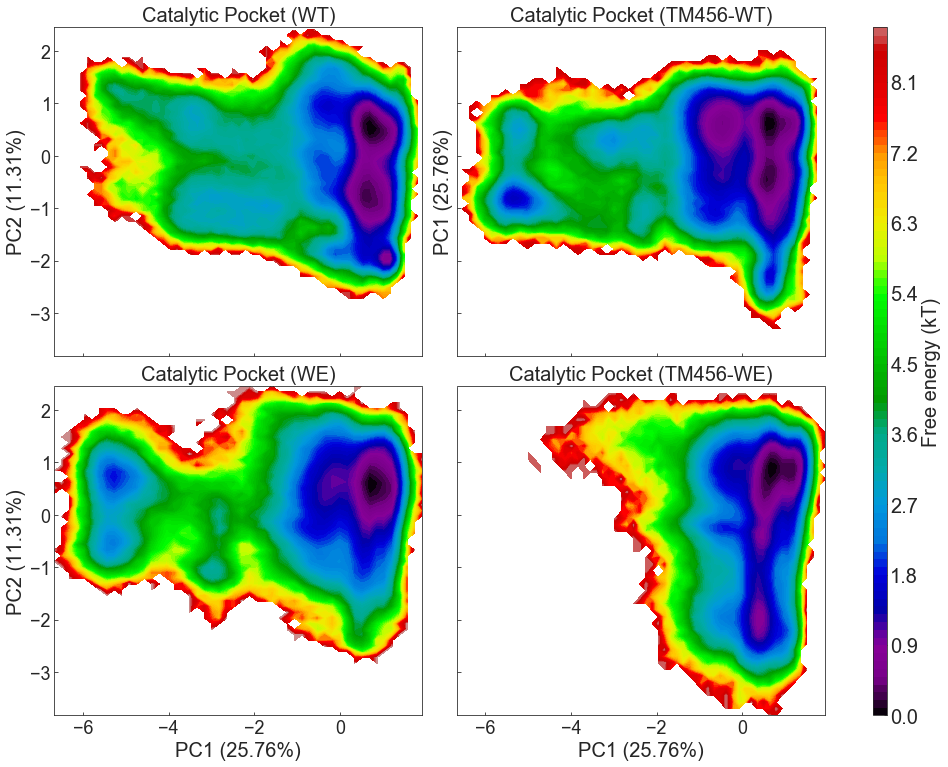

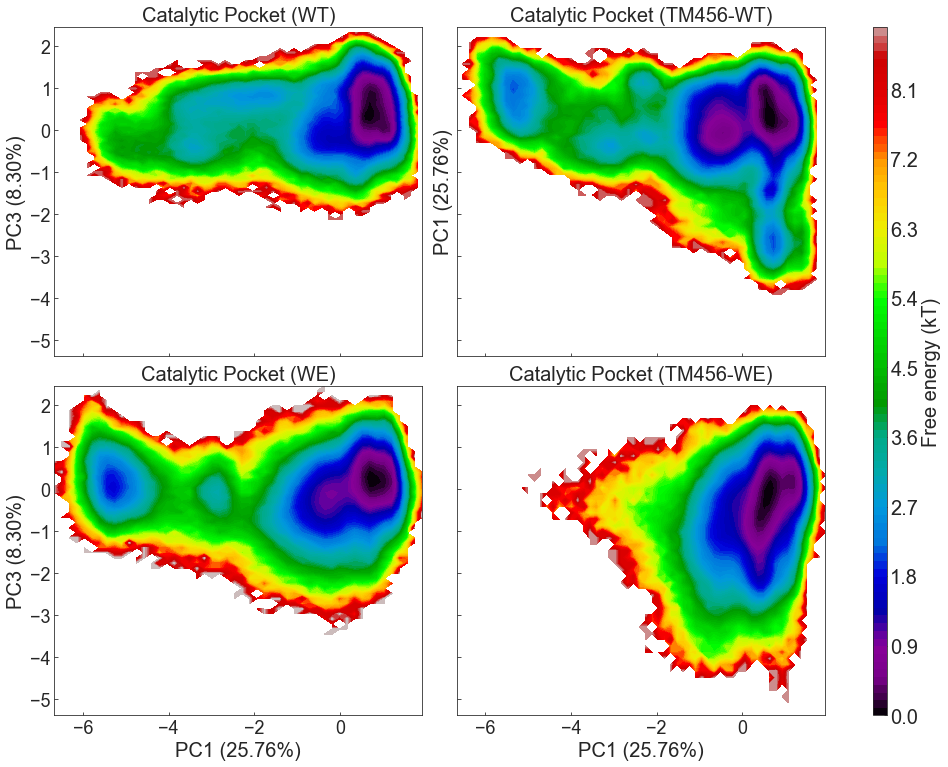

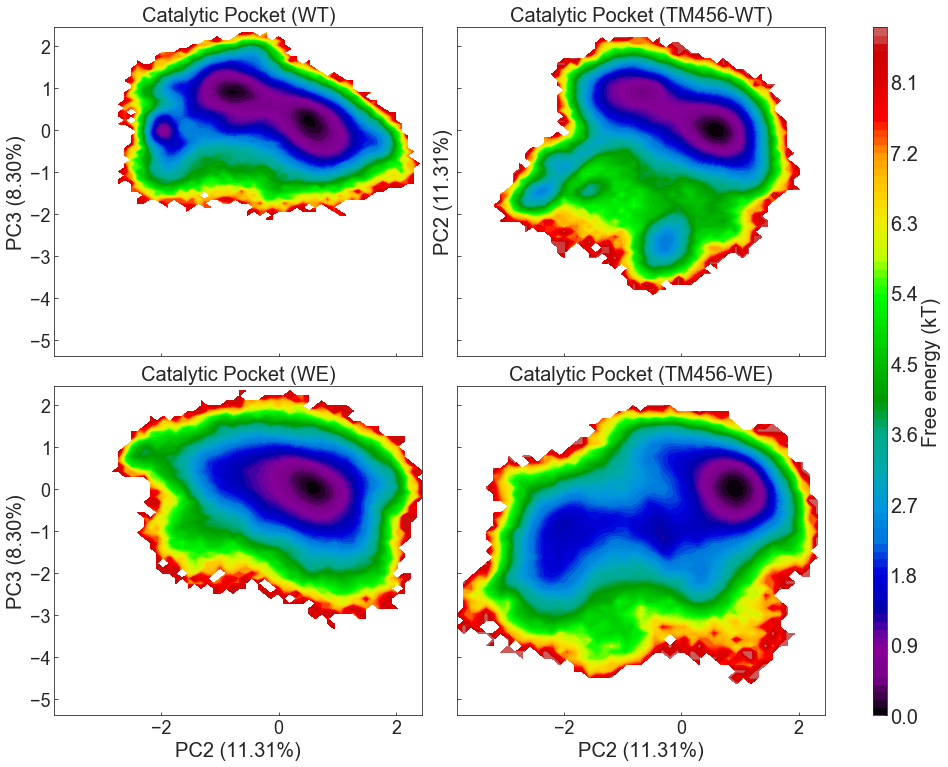

In [9]:
plot_free_energy(catalyticPocket_pca,catalyticPocket_variance,0,1,
                 frames_WT,frames_TM456_WT,frames_WE,frames_TM456_WE,
                 0,9,'Catalytic Pocket','catalyticPocket')
plot_free_energy(catalyticPocket_pca,catalyticPocket_variance,0,2,
                 frames_WT,frames_TM456_WT,frames_WE,frames_TM456_WE,
                 0,9,'Catalytic Pocket','catalyticPocket')
plot_free_energy(catalyticPocket_pca,catalyticPocket_variance,1,2,
                 frames_WT,frames_TM456_WT,frames_WE,frames_TM456_WE,
                 0,9,'Catalytic Pocket','catalyticPocket')

In [10]:
# Regulatory Loops
regulatoryLoops_pca=np.load(path+'pca/PcaBasisFromAll/regulatoryLoops/projection.npy')
regulatoryLoops_variance=np.load(path+'pca/PcaBasisFromAll/regulatoryLoops/variance.npy')

/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:19: RuntimeWarning: divide by zero encountered in log
/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:34: RuntimeWarning: divide by zero encountered in log
/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:48: RuntimeWarning: divide by zero encountered in log
/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:63: RuntimeWarning: divide by zero encountered in log
/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:86: MatplotlibDeprecationWarning: 
The set_clim function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use ScalarMappable.set_clim instead.
/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:19: RuntimeWarning: divide by zero encountered in log
/home/wud18/install/anaconda3/envs/

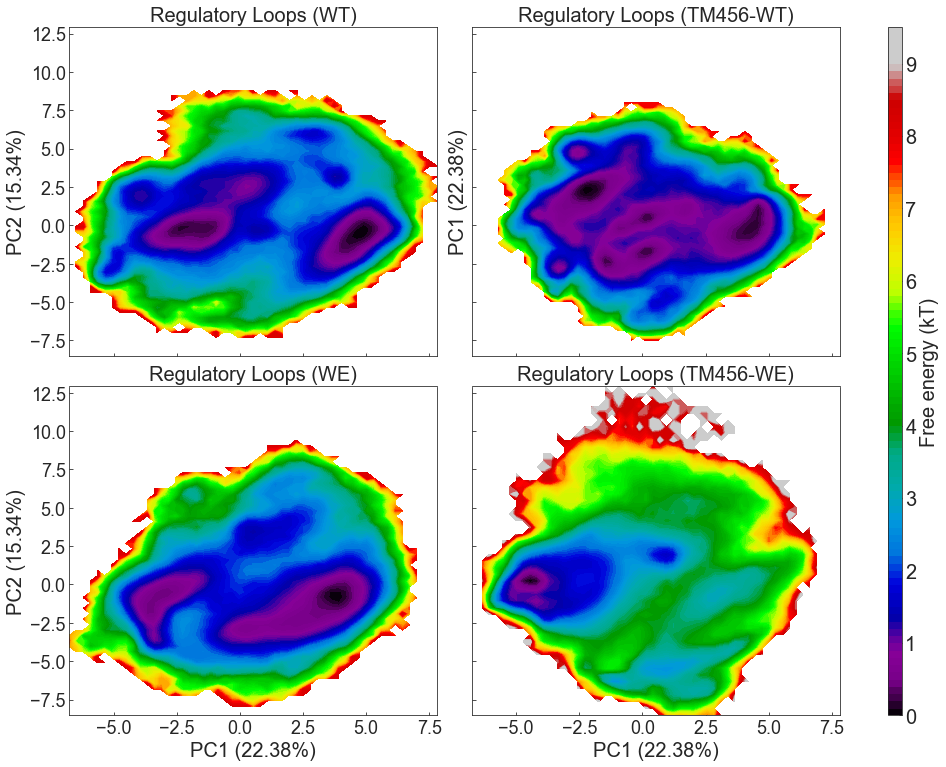

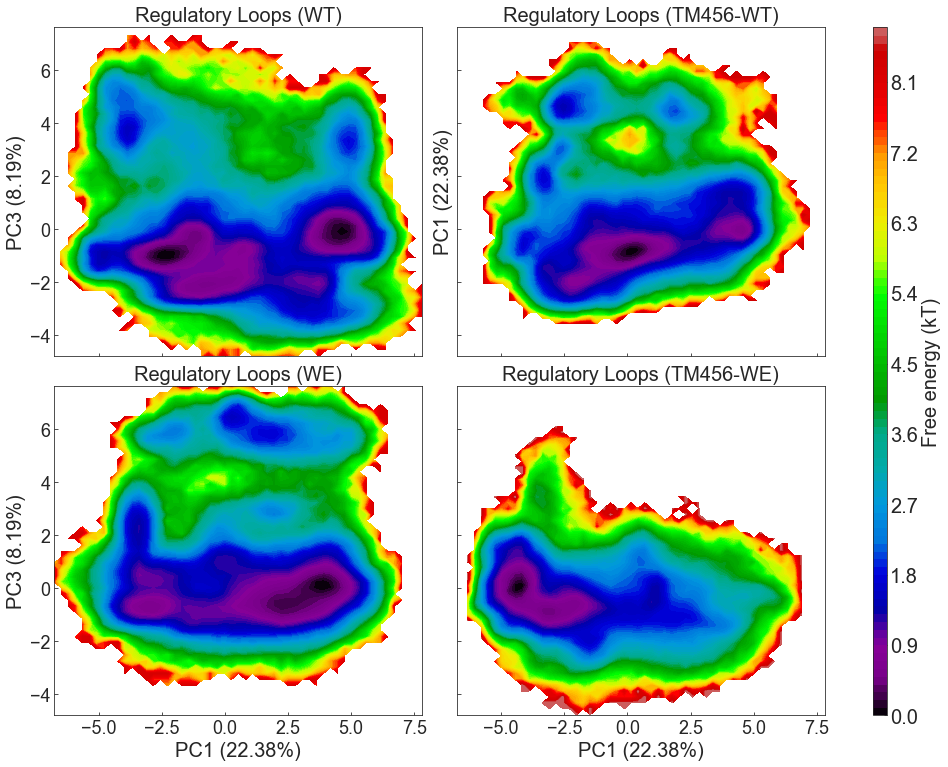

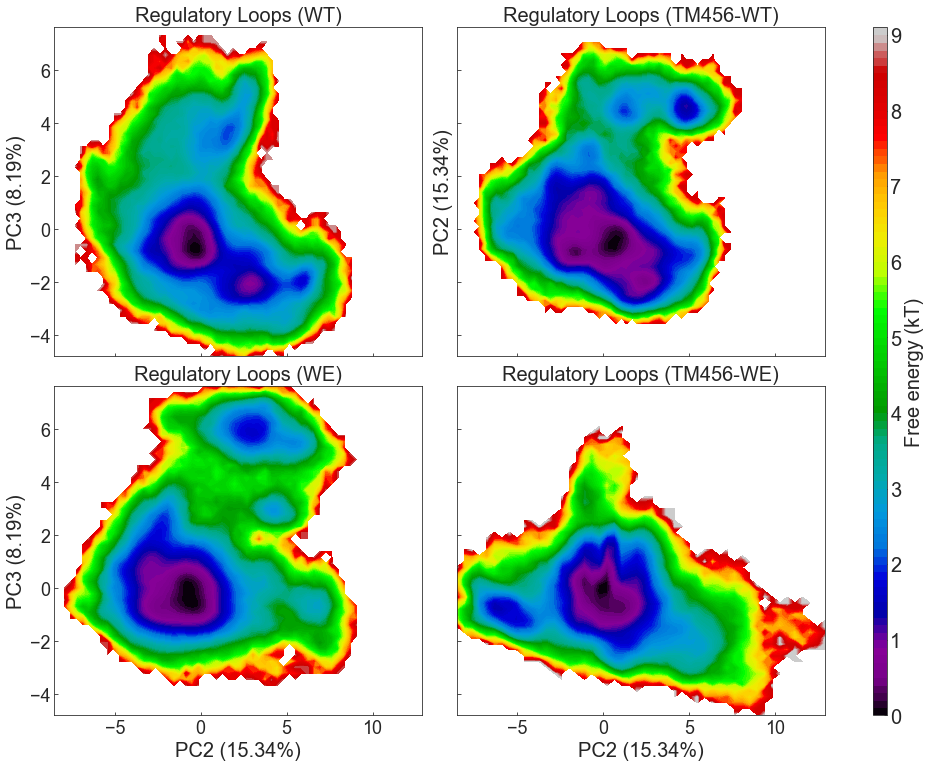

In [11]:
plot_free_energy(regulatoryLoops_pca,regulatoryLoops_variance,0,1,
                 frames_WT,frames_TM456_WT,frames_WE,frames_TM456_WE,
                 0,9,'Regulatory Loops','regulatoryLoops')
plot_free_energy(regulatoryLoops_pca,regulatoryLoops_variance,0,2,
                 frames_WT,frames_TM456_WT,frames_WE,frames_TM456_WE,
                 0,9,'Regulatory Loops','regulatoryLoops')
plot_free_energy(regulatoryLoops_pca,regulatoryLoops_variance,1,2,
                 frames_WT,frames_TM456_WT,frames_WE,frames_TM456_WE,
                 0,9,'Regulatory Loops','regulatoryLoops')

In [12]:
# 60s Loop
sixtysLoop_pca=np.load(path+'pca/PcaBasisFromAll/60sLoop/projection.npy')
sixtysLoop_variance=np.load(path+'pca/PcaBasisFromAll/60sLoop/variance.npy')

/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:19: RuntimeWarning: divide by zero encountered in log
/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:34: RuntimeWarning: divide by zero encountered in log
/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:48: RuntimeWarning: divide by zero encountered in log
/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:63: RuntimeWarning: divide by zero encountered in log
/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:86: MatplotlibDeprecationWarning: 
The set_clim function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use ScalarMappable.set_clim instead.
/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:19: RuntimeWarning: divide by zero encountered in log
/home/wud18/install/anaconda3/envs/

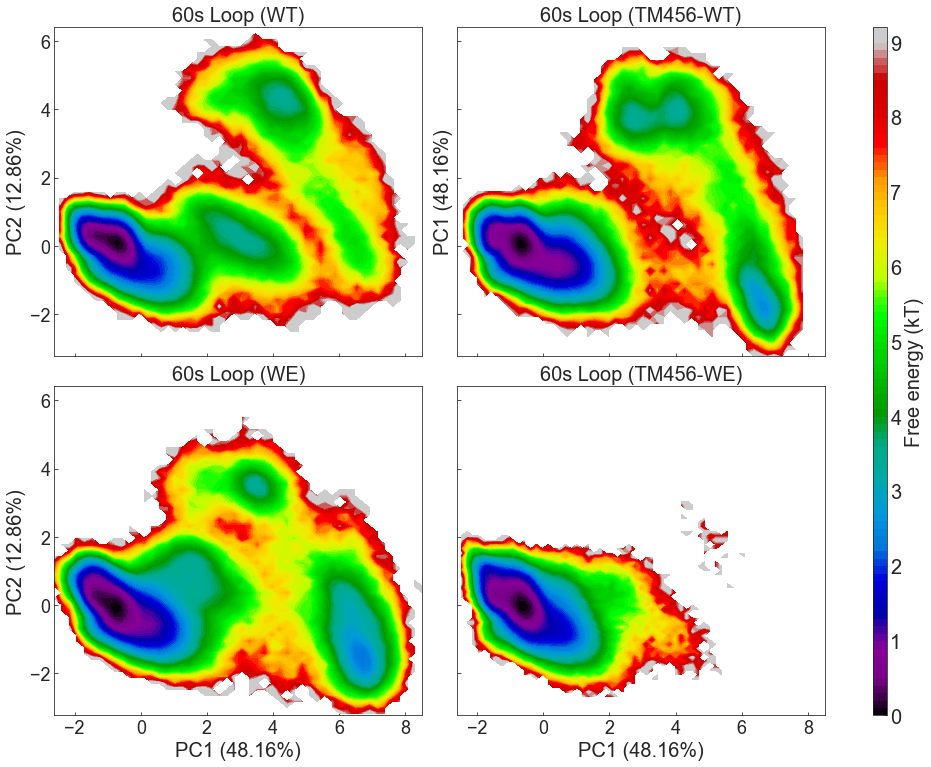

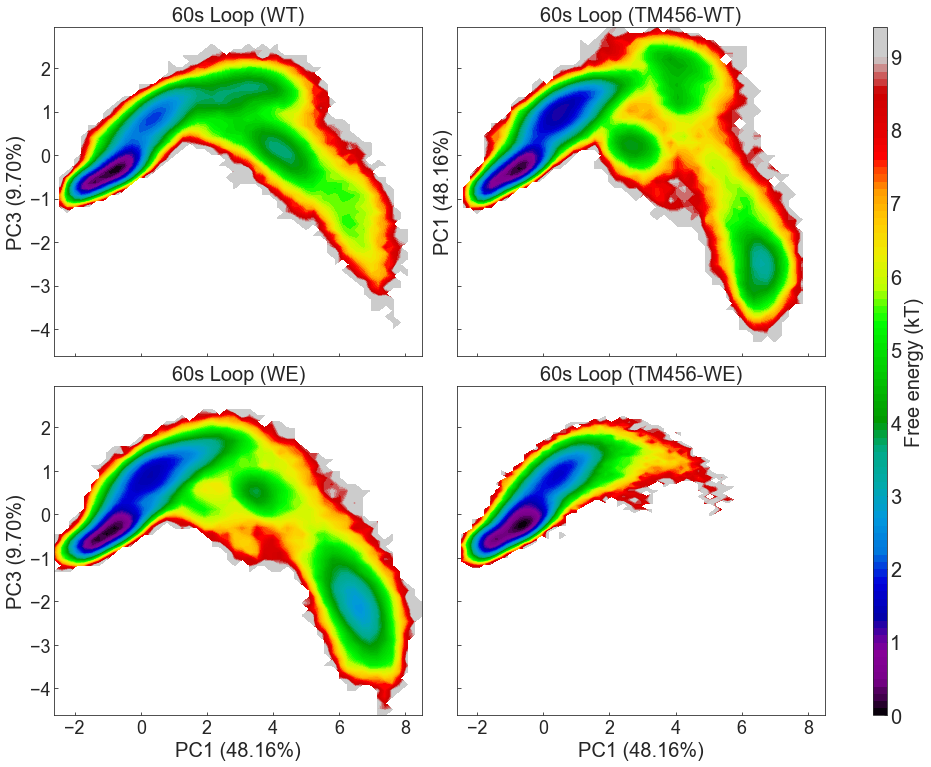

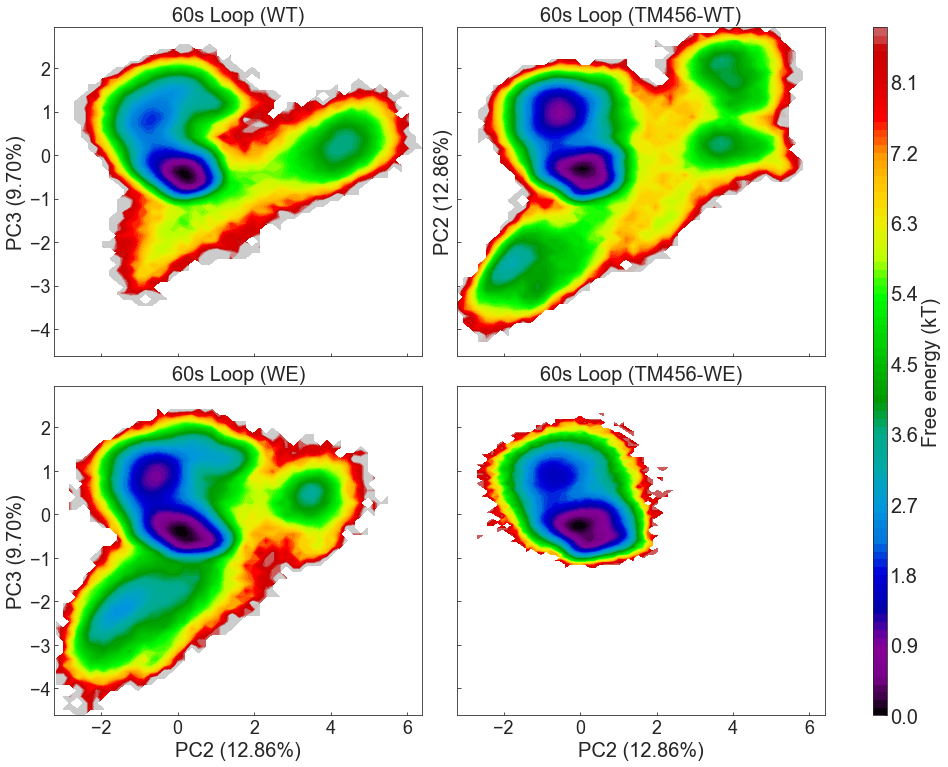

In [13]:
plot_free_energy(sixtysLoop_pca,sixtysLoop_variance,0,1,
                 frames_WT,frames_TM456_WT,frames_WE,frames_TM456_WE,
                 0,9,'60s Loop','60sLoop')
plot_free_energy(sixtysLoop_pca,sixtysLoop_variance,0,2,
                 frames_WT,frames_TM456_WT,frames_WE,frames_TM456_WE,
                 0,9,'60s Loop','60sLoop')
plot_free_energy(sixtysLoop_pca,sixtysLoop_variance,1,2,
                 frames_WT,frames_TM456_WT,frames_WE,frames_TM456_WE,
                 0,9,'60s Loop','60sLoop')

In [14]:
# Helix1 (residue 158 to 166)
helix1_pca=np.load(path+'pca/PcaBasisFromAll/helix1/projection.npy')
helix1_variance=np.load(path+'pca/PcaBasisFromAll/helix1/variance.npy')

/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:19: RuntimeWarning: divide by zero encountered in log
/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:34: RuntimeWarning: divide by zero encountered in log
/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:48: RuntimeWarning: divide by zero encountered in log
/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:63: RuntimeWarning: divide by zero encountered in log
/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:86: MatplotlibDeprecationWarning: 
The set_clim function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use ScalarMappable.set_clim instead.
/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:19: RuntimeWarning: divide by zero encountered in log
/home/wud18/install/anaconda3/envs/

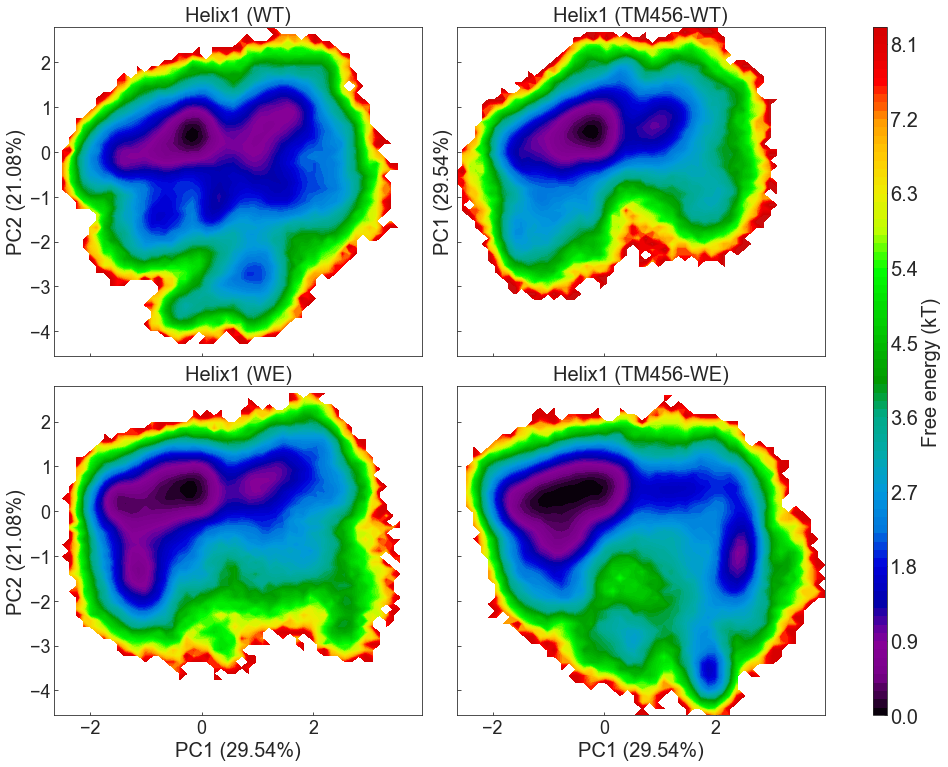

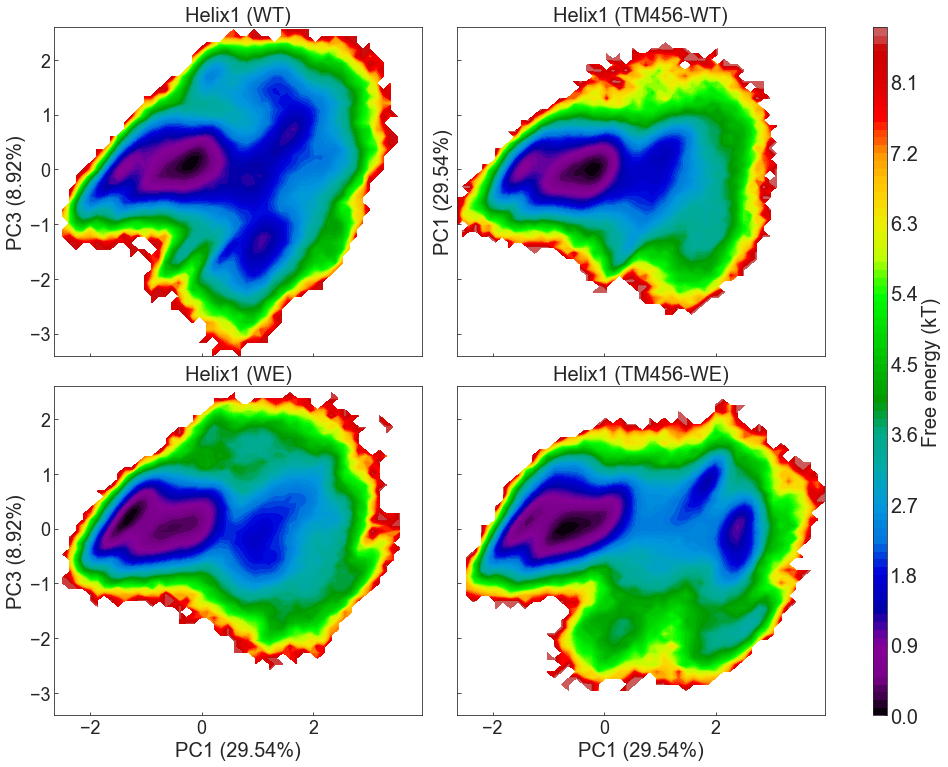

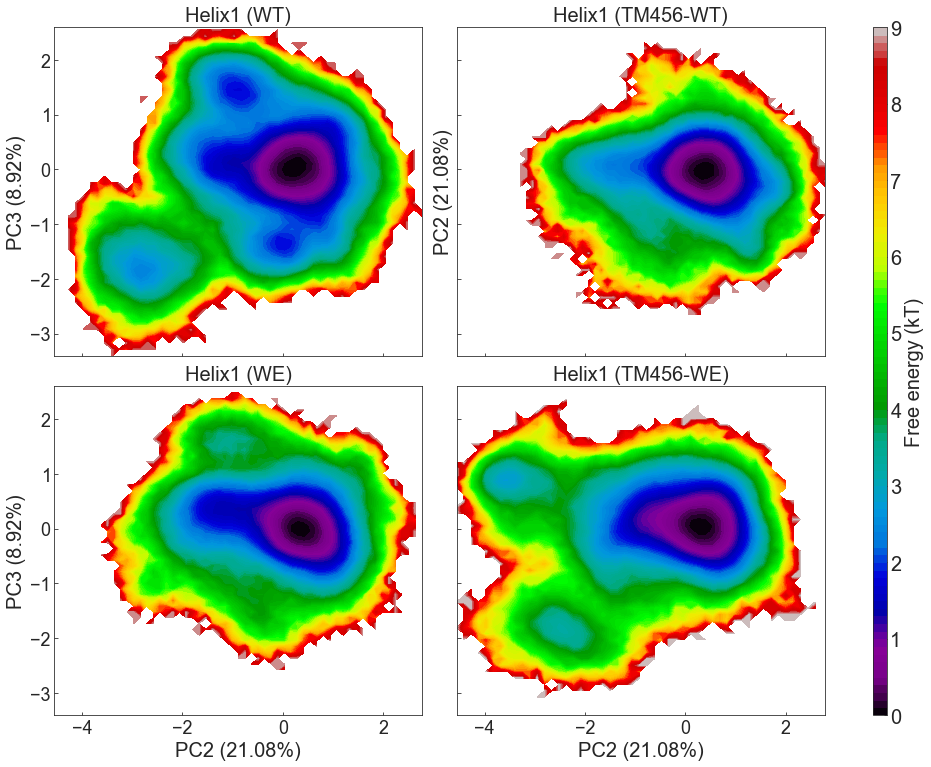

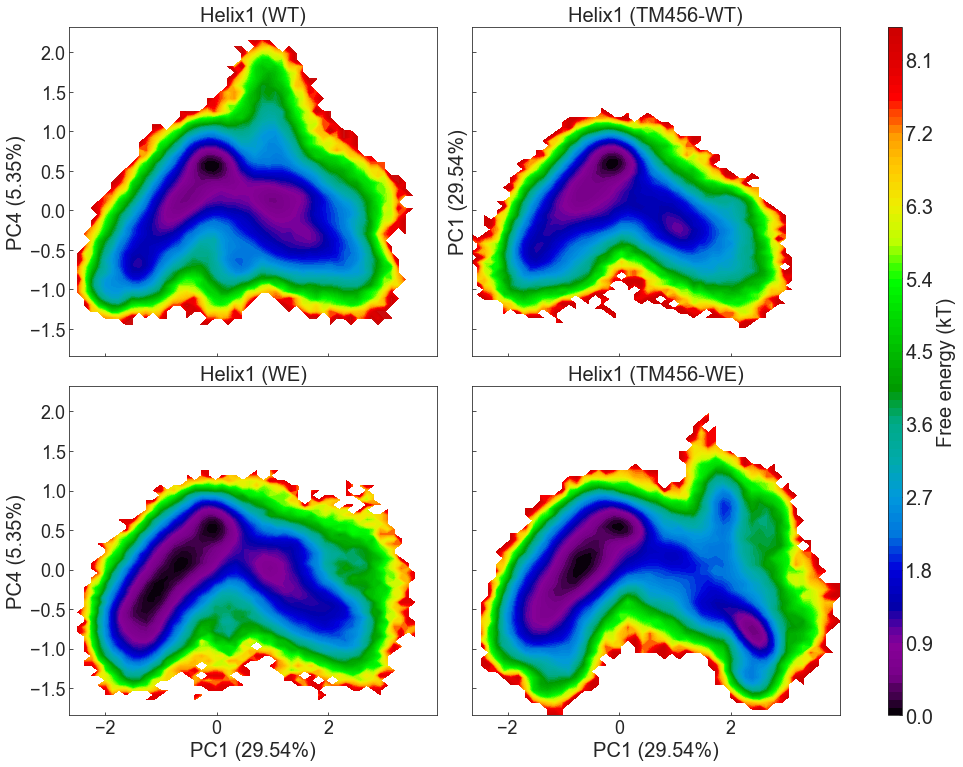

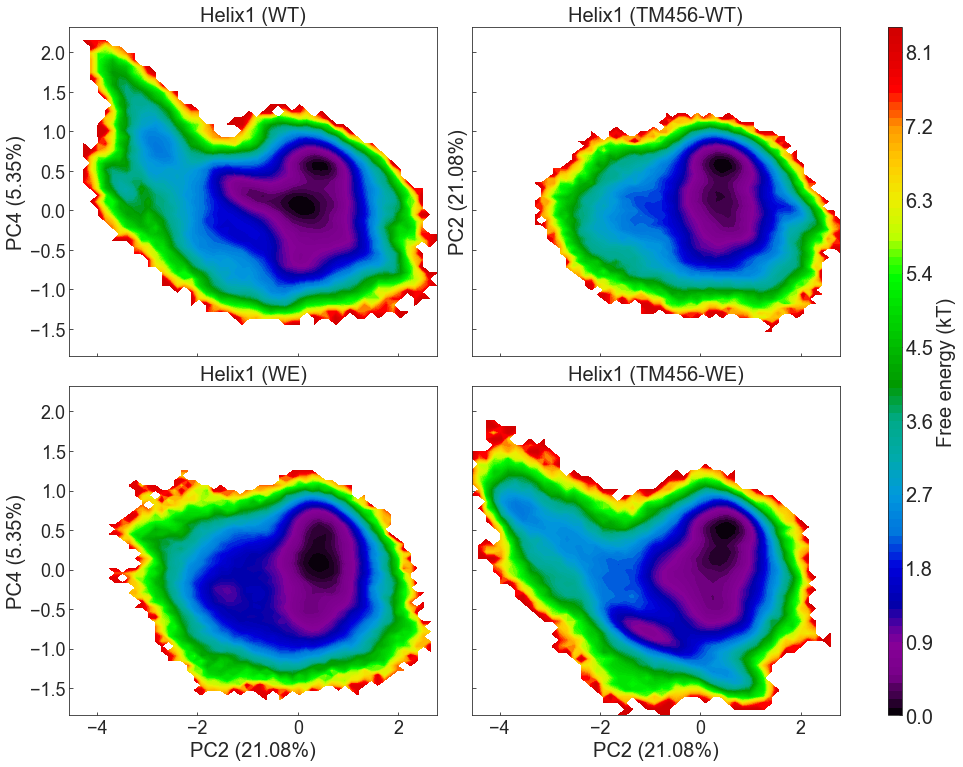

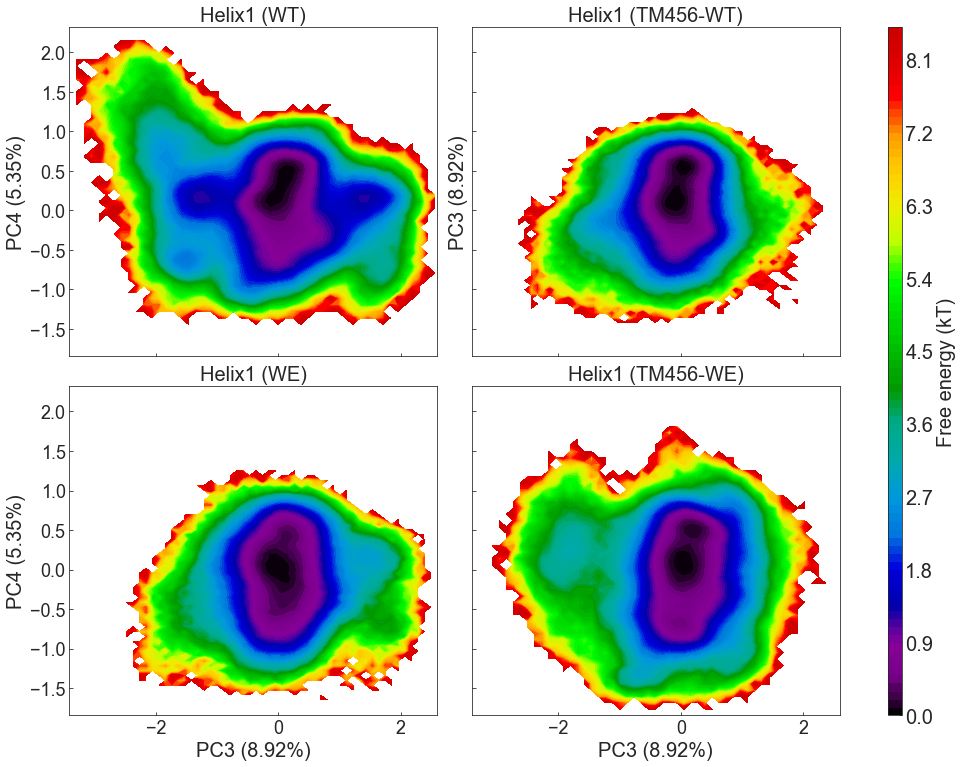

In [15]:
plot_free_energy(helix1_pca,helix1_variance,0,1,
                 frames_WT,frames_TM456_WT,frames_WE,frames_TM456_WE,
                 0,9,'Helix1','helix1')
plot_free_energy(helix1_pca,helix1_variance,0,2,
                 frames_WT,frames_TM456_WT,frames_WE,frames_TM456_WE,
                 0,9,'Helix1','helix1')
plot_free_energy(helix1_pca,helix1_variance,1,2,
                 frames_WT,frames_TM456_WT,frames_WE,frames_TM456_WE,
                 0,9,'Helix1','helix1')
plot_free_energy(helix1_pca,helix1_variance,0,3,
                 frames_WT,frames_TM456_WT,frames_WE,frames_TM456_WE,
                 0,9,'Helix1','helix1')
plot_free_energy(helix1_pca,helix1_variance,1,3,
                 frames_WT,frames_TM456_WT,frames_WE,frames_TM456_WE,
                 0,9,'Helix1','helix1')
plot_free_energy(helix1_pca,helix1_variance,2,3,
                 frames_WT,frames_TM456_WT,frames_WE,frames_TM456_WE,
                 0,9,'Helix1','helix1')

In [16]:
# Gamma Loop
gammaLoop_pca=np.load(path+'pca/PcaBasisFromAll/gammaLoop/projection.npy')
gammaLoop_variance=np.load(path+'pca/PcaBasisFromAll/gammaLoop/variance.npy')

/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:19: RuntimeWarning: divide by zero encountered in log
/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:34: RuntimeWarning: divide by zero encountered in log
/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:48: RuntimeWarning: divide by zero encountered in log
/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:63: RuntimeWarning: divide by zero encountered in log
/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:86: MatplotlibDeprecationWarning: 
The set_clim function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use ScalarMappable.set_clim instead.
/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:19: RuntimeWarning: divide by zero encountered in log
/home/wud18/install/anaconda3/envs/

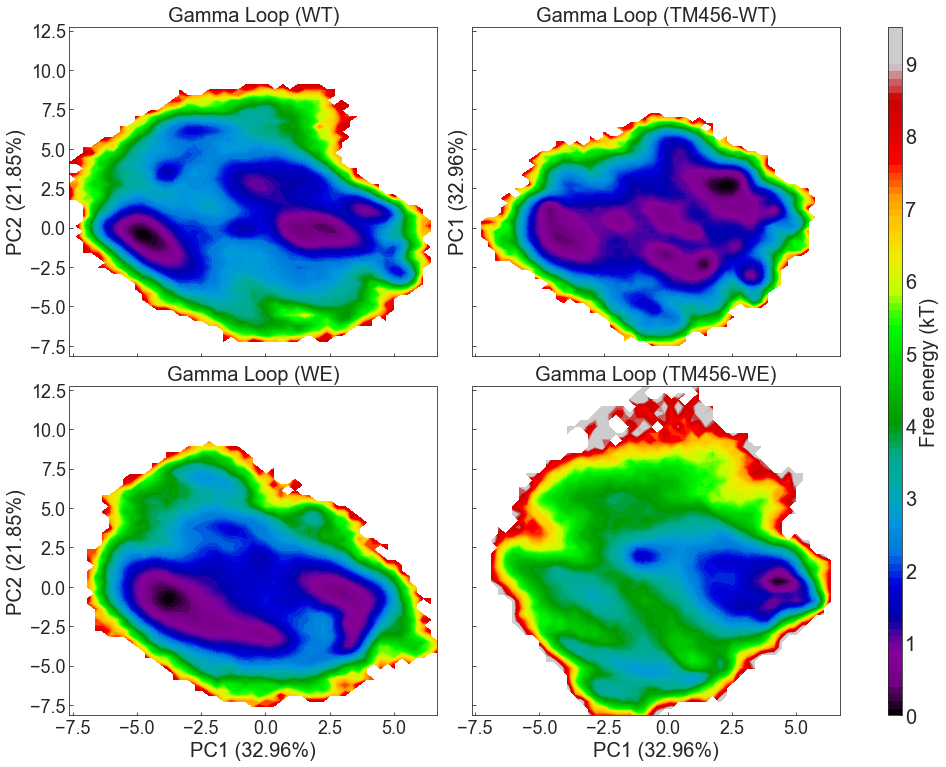

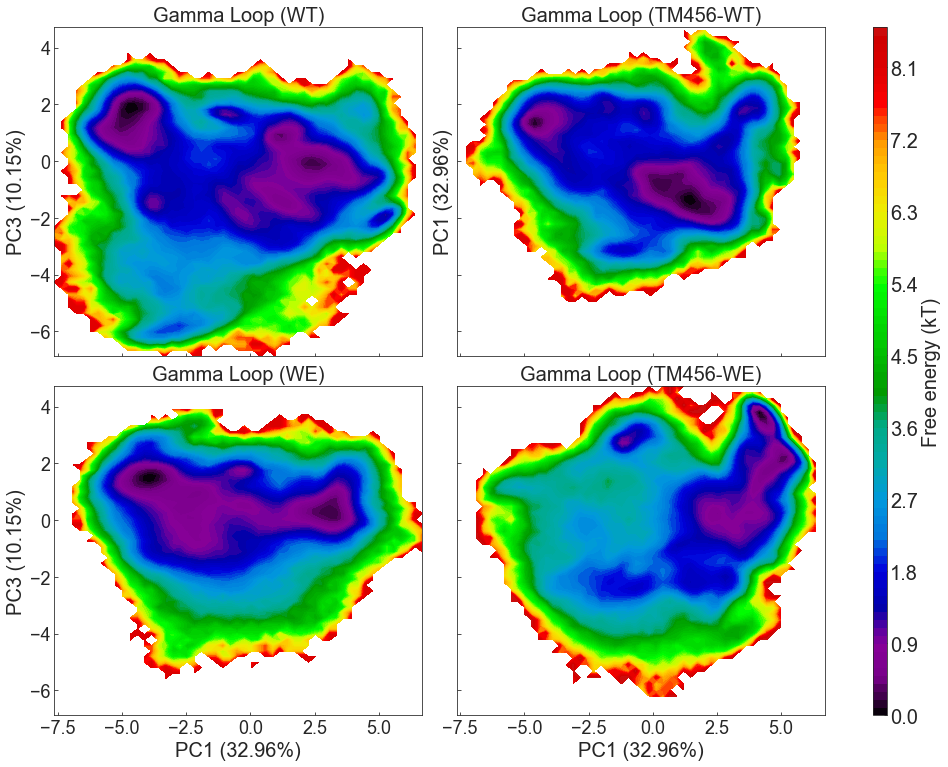

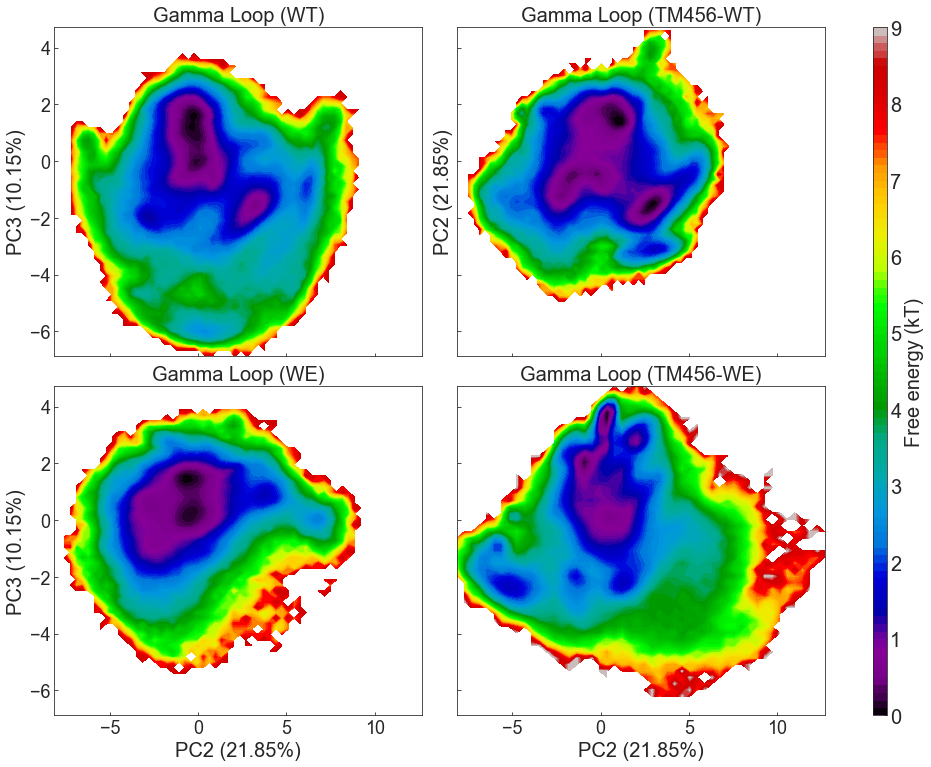

In [17]:
plot_free_energy(gammaLoop_pca,gammaLoop_variance,0,1,
                 frames_WT,frames_TM456_WT,frames_WE,frames_TM456_WE,
                 0,9,'Gamma Loop','gammaLoop')
plot_free_energy(gammaLoop_pca,gammaLoop_variance,0,2,
                 frames_WT,frames_TM456_WT,frames_WE,frames_TM456_WE,
                 0,9,'Gamma Loop','gammaLoop')
plot_free_energy(gammaLoop_pca,gammaLoop_variance,1,2,
                 frames_WT,frames_TM456_WT,frames_WE,frames_TM456_WE,
                 0,9,'Gamma Loop','gammaLoop')

In [18]:
# 170s Loop (residue 205 to 212)
I70sLoop_pca=np.load(path+'pca/PcaBasisFromAll/170sLoop/projection.npy')
I70sLoop_variance=np.load(path+'pca/PcaBasisFromAll/170sLoop/variance.npy')

/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:19: RuntimeWarning: divide by zero encountered in log
/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:34: RuntimeWarning: divide by zero encountered in log
/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:48: RuntimeWarning: divide by zero encountered in log
/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:63: RuntimeWarning: divide by zero encountered in log
/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:86: MatplotlibDeprecationWarning: 
The set_clim function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use ScalarMappable.set_clim instead.
/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:19: RuntimeWarning: divide by zero encountered in log
/home/wud18/install/anaconda3/envs/

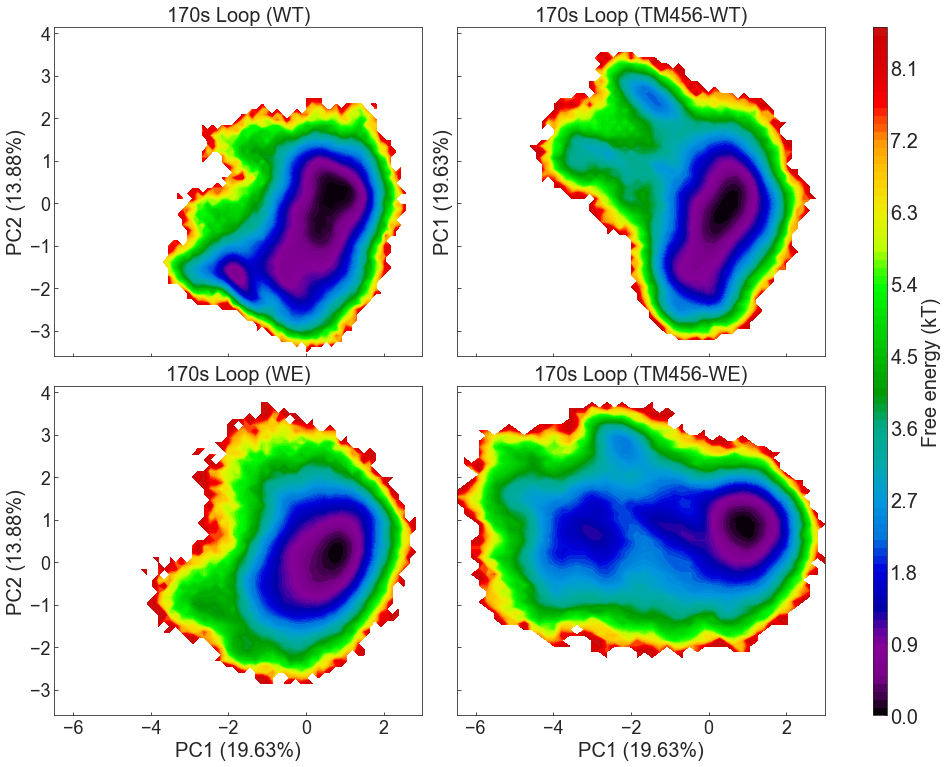

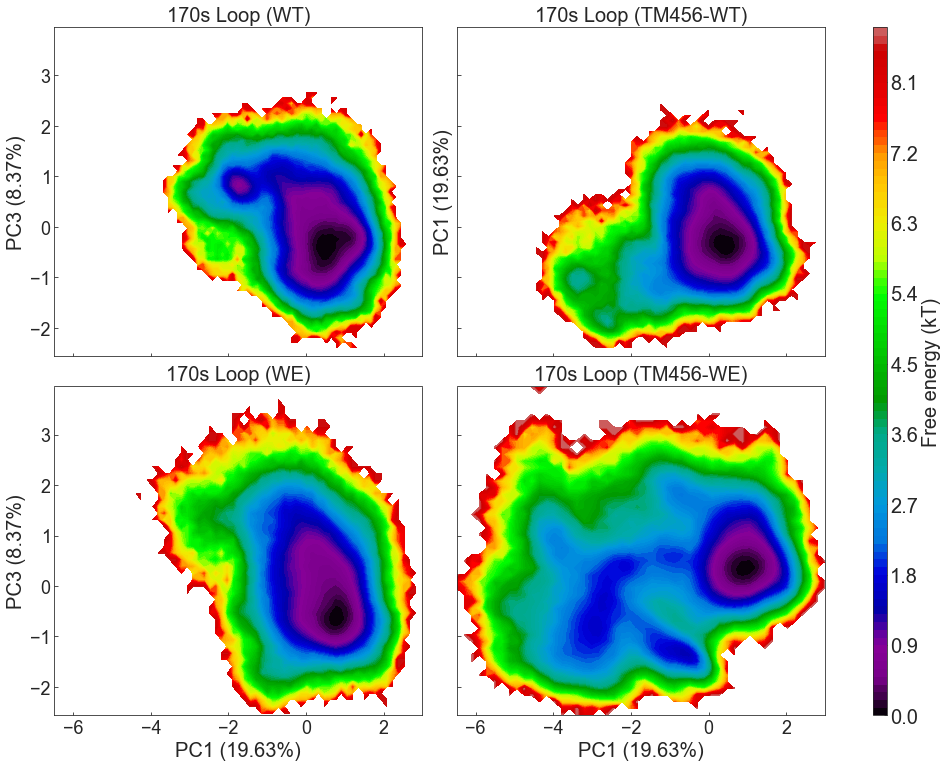

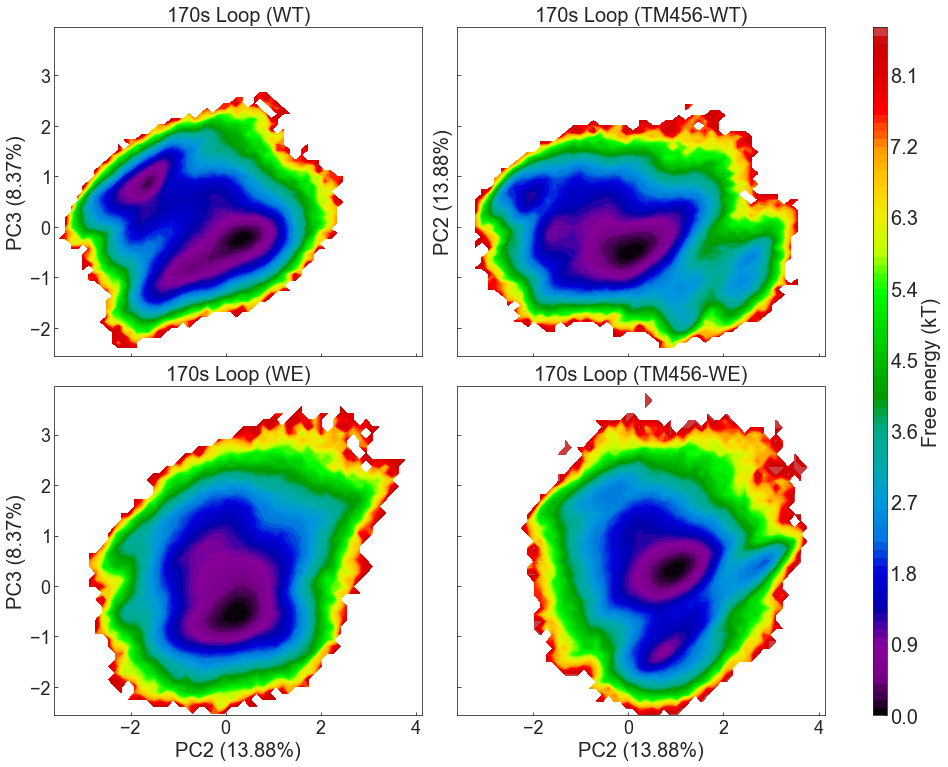

In [19]:
plot_free_energy(I70sLoop_pca,I70sLoop_variance,0,1,
                 frames_WT,frames_TM456_WT,frames_WE,frames_TM456_WE,
                 0,9,'170s Loop','170sLoop')
plot_free_energy(I70sLoop_pca,I70sLoop_variance,0,2,
                 frames_WT,frames_TM456_WT,frames_WE,frames_TM456_WE,
                 0,9,'170s Loop','170sLoop')
plot_free_energy(I70sLoop_pca,I70sLoop_variance,1,2,
                 frames_WT,frames_TM456_WT,frames_WE,frames_TM456_WE,
                 0,9,'170s Loop','170sLoop')

In [20]:
# 180s Loop (residue 205 to 212)
I80sLoop_pca=np.load(path+'pca/PcaBasisFromAll/180sLoop/projection.npy')
I80sLoop_variance=np.load(path+'pca/PcaBasisFromAll/180sLoop/variance.npy')

/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:19: RuntimeWarning: divide by zero encountered in log
/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:34: RuntimeWarning: divide by zero encountered in log
/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:48: RuntimeWarning: divide by zero encountered in log
/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:63: RuntimeWarning: divide by zero encountered in log
/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:86: MatplotlibDeprecationWarning: 
The set_clim function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use ScalarMappable.set_clim instead.
/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:19: RuntimeWarning: divide by zero encountered in log
/home/wud18/install/anaconda3/envs/

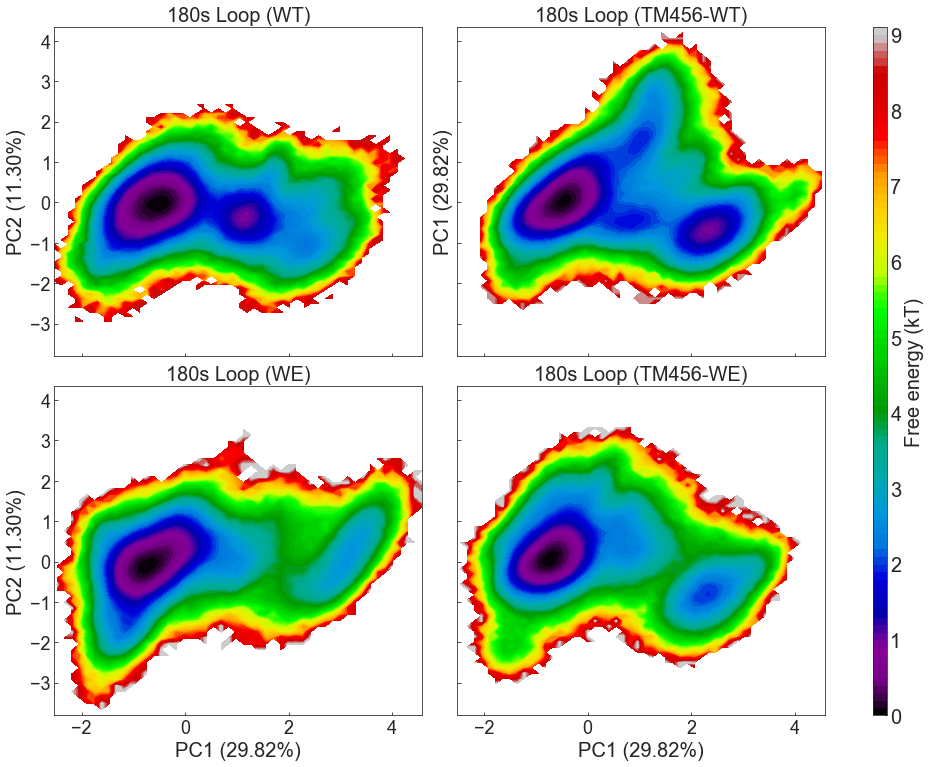

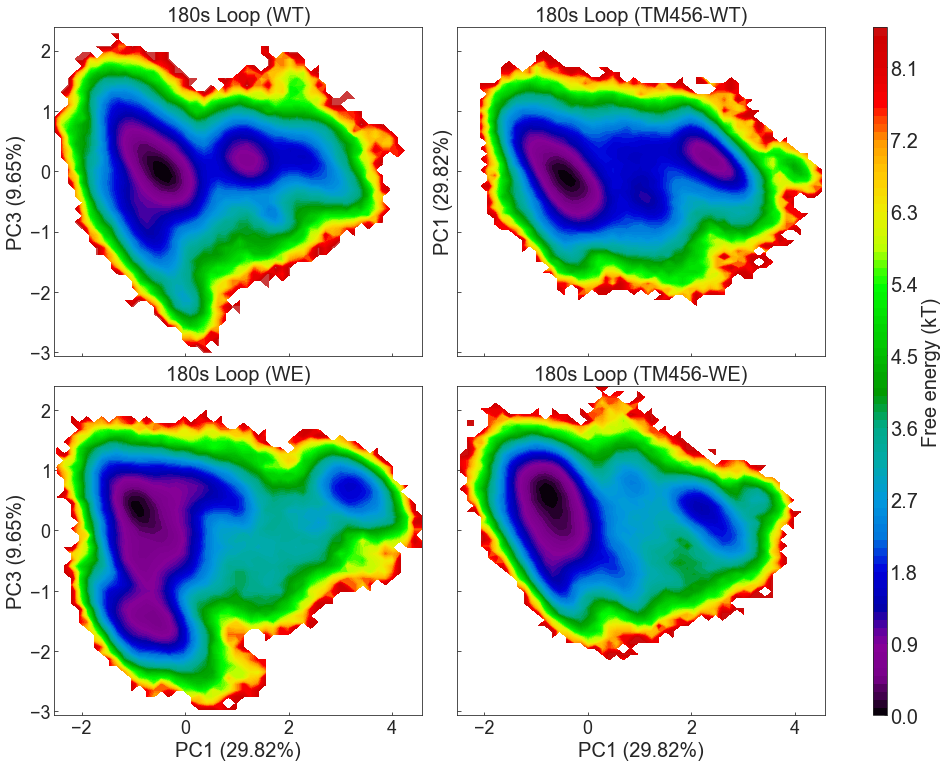

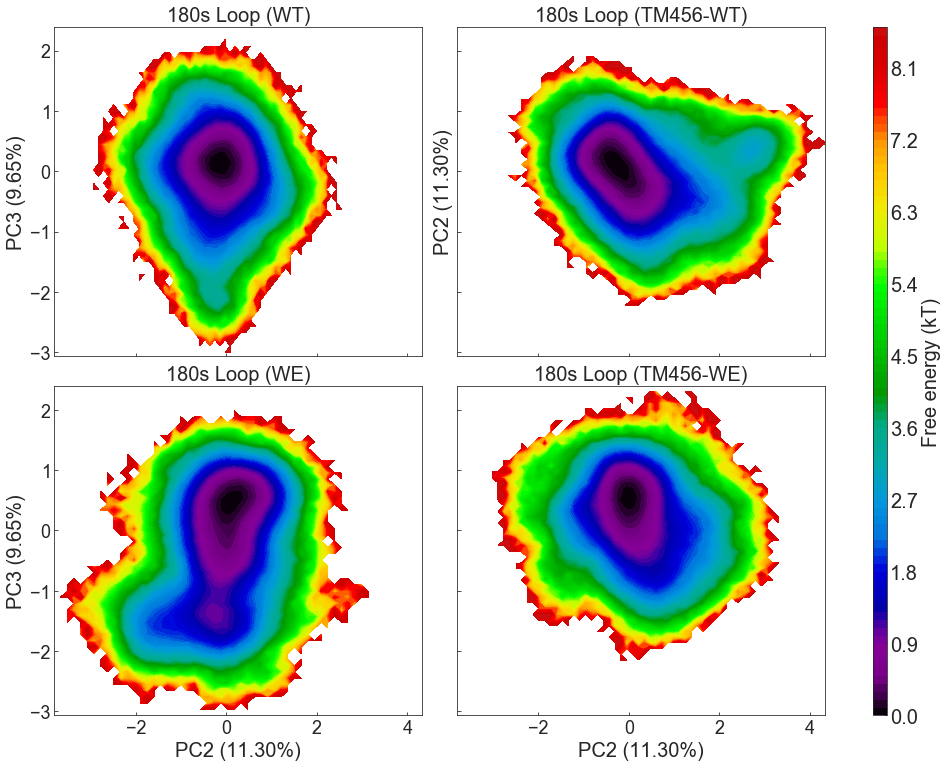

In [21]:
plot_free_energy(I80sLoop_pca,I80sLoop_variance,0,1,
                 frames_WT,frames_TM456_WT,frames_WE,frames_TM456_WE,
                 0,9,'180s Loop','180sLoop')
plot_free_energy(I80sLoop_pca,I80sLoop_variance,0,2,
                 frames_WT,frames_TM456_WT,frames_WE,frames_TM456_WE,
                 0,9,'180s Loop','180sLoop')
plot_free_energy(I80sLoop_pca,I80sLoop_variance,1,2,
                 frames_WT,frames_TM456_WT,frames_WE,frames_TM456_WE,
                 0,9,'180s Loop','180sLoop')

In [22]:
# Sodium Loop
sodiumLoop_pca=np.load(path+'pca/PcaBasisFromAll/sodiumLoop/projection.npy')
sodiumLoop_variance=np.load(path+'pca/PcaBasisFromAll/sodiumLoop/variance.npy')

/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:19: RuntimeWarning: divide by zero encountered in log
/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:34: RuntimeWarning: divide by zero encountered in log
/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:48: RuntimeWarning: divide by zero encountered in log
/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:63: RuntimeWarning: divide by zero encountered in log
/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:86: MatplotlibDeprecationWarning: 
The set_clim function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use ScalarMappable.set_clim instead.
/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:19: RuntimeWarning: divide by zero encountered in log
/home/wud18/install/anaconda3/envs/

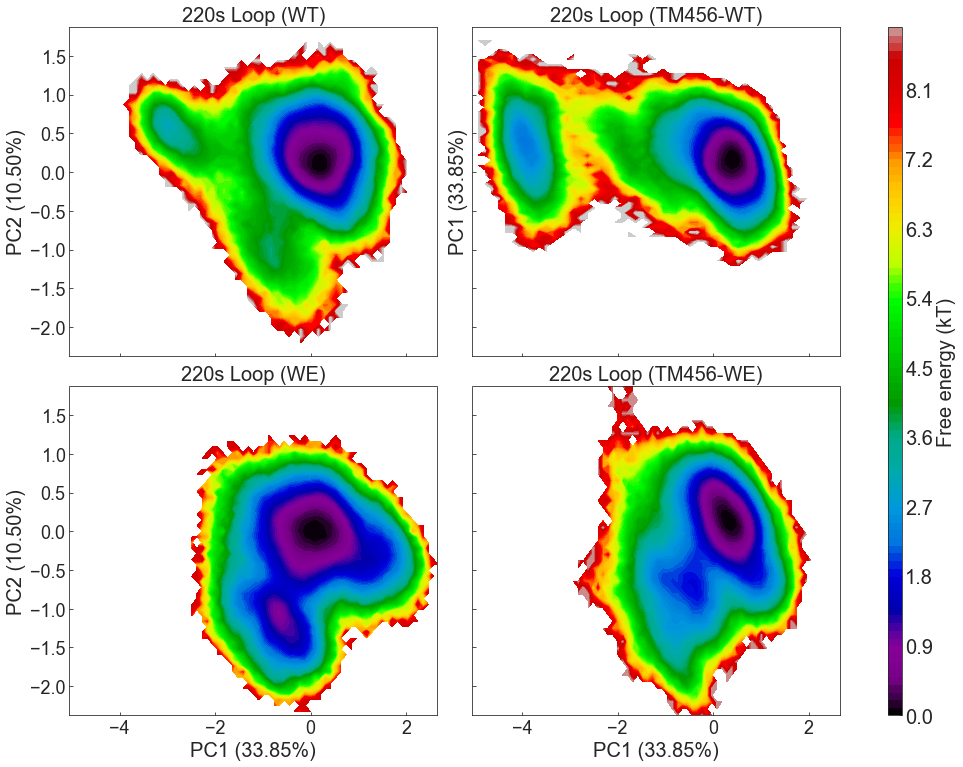

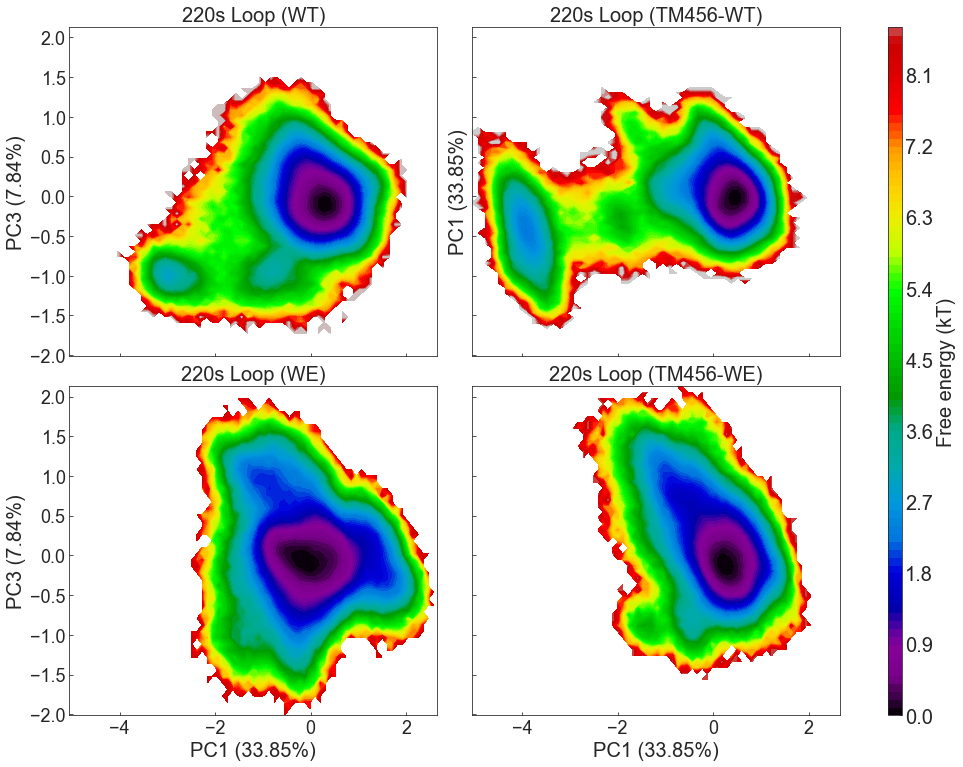

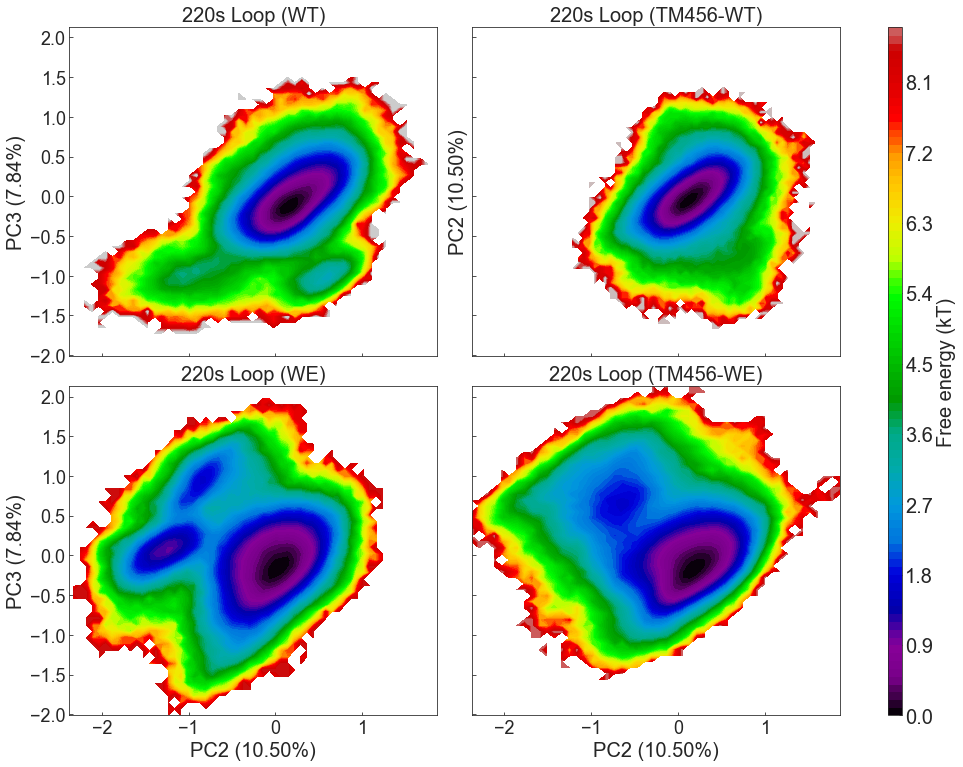

In [23]:
plot_free_energy(sodiumLoop_pca,sodiumLoop_variance,0,1,
                 frames_WT,frames_TM456_WT,frames_WE,frames_TM456_WE,
                 0,9,'220s Loop','sodiumLoop')
plot_free_energy(sodiumLoop_pca,sodiumLoop_variance,0,2,
                 frames_WT,frames_TM456_WT,frames_WE,frames_TM456_WE,
                 0,9,'220s Loop','sodiumLoop')
plot_free_energy(sodiumLoop_pca,sodiumLoop_variance,1,2,
                 frames_WT,frames_TM456_WT,frames_WE,frames_TM456_WE,
                 0,9,'220s Loop','sodiumLoop')

In [24]:
# Catalytic Triad
catalyticTriad_pca=np.load(path+'pca/PcaBasisFromAll/catalyticTriad/projection.npy')
catalyticTriad_variance=np.load(path+'pca/PcaBasisFromAll/catalyticTriad/variance.npy')

/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:19: RuntimeWarning: divide by zero encountered in log
/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:34: RuntimeWarning: divide by zero encountered in log
/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:48: RuntimeWarning: divide by zero encountered in log
/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:63: RuntimeWarning: divide by zero encountered in log
/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:86: MatplotlibDeprecationWarning: 
The set_clim function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use ScalarMappable.set_clim instead.
/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:19: RuntimeWarning: divide by zero encountered in log
/home/wud18/install/anaconda3/envs/

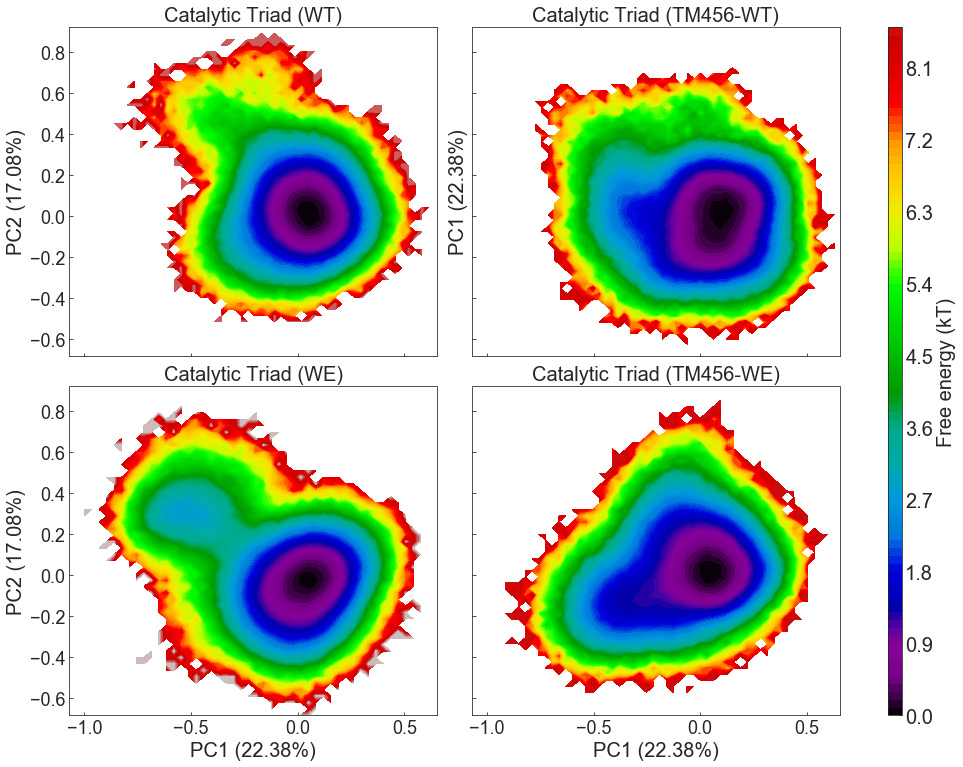

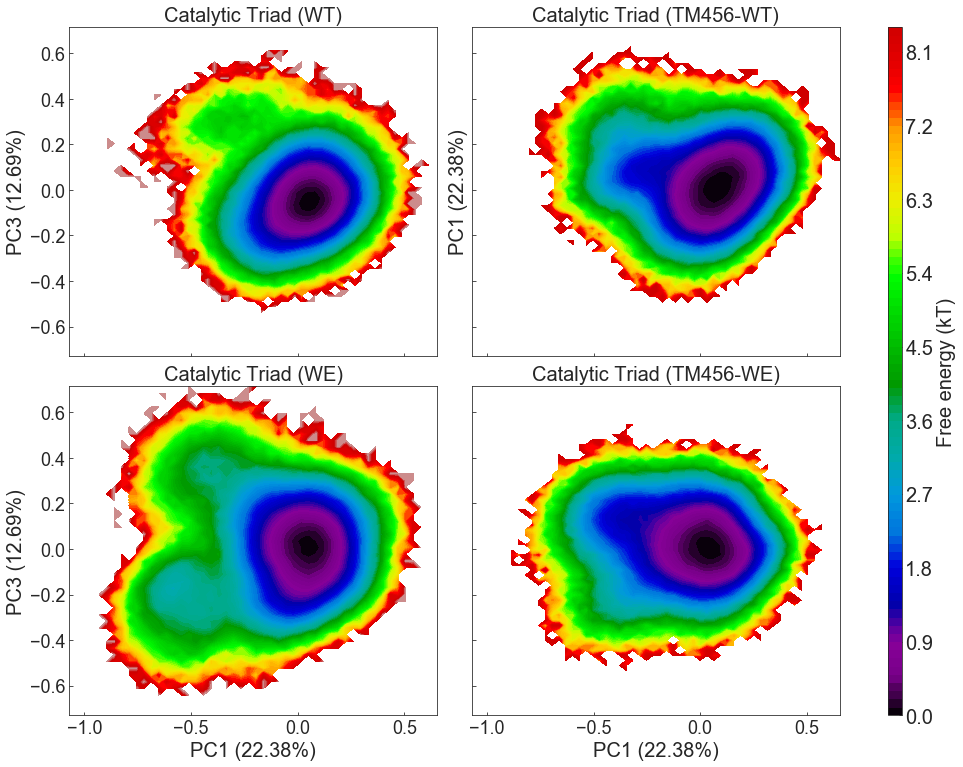

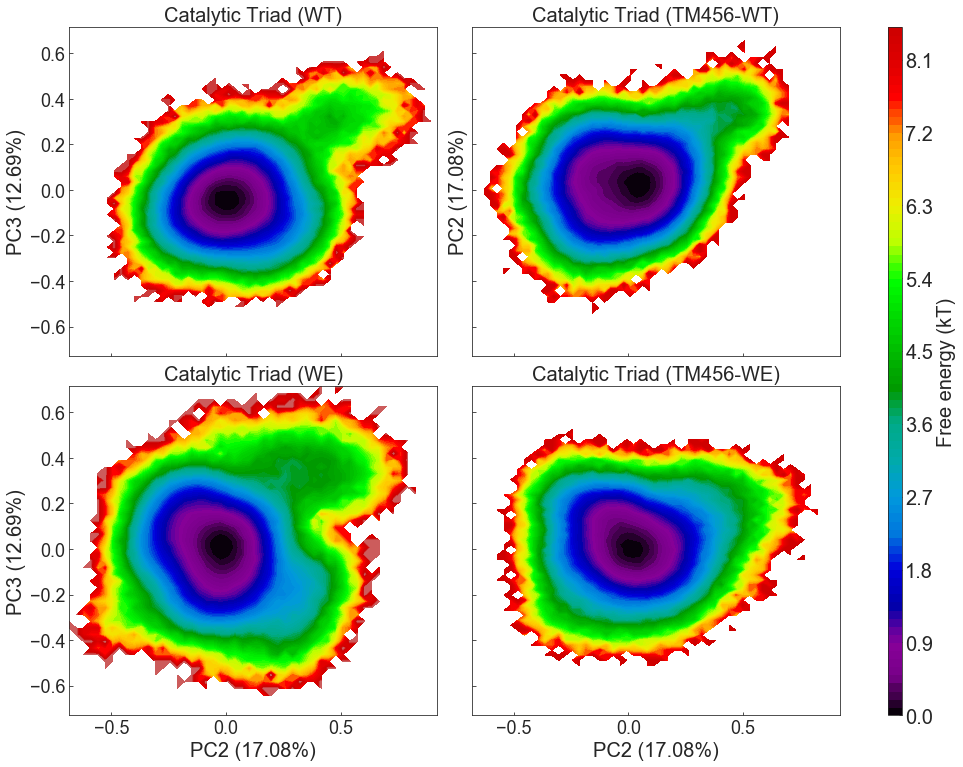

In [25]:
plot_free_energy(catalyticTriad_pca,catalyticTriad_variance,0,1,
                 frames_WT,frames_TM456_WT,frames_WE,frames_TM456_WE,
                 0,9,'Catalytic Triad','catalyticTriad')
plot_free_energy(catalyticTriad_pca,catalyticTriad_variance,0,2,
                 frames_WT,frames_TM456_WT,frames_WE,frames_TM456_WE,
                 0,9,'Catalytic Triad','catalyticTriad')
plot_free_energy(catalyticTriad_pca,catalyticTriad_variance,1,2,
                 frames_WT,frames_TM456_WT,frames_WE,frames_TM456_WE,
                 0,9,'Catalytic Triad','catalyticTriad')

In [26]:
# Exosite I
exositeI_pca=np.load(path+'pca/PcaBasisFromAll/exositeI/projection.npy')
exositeI_variance=np.load(path+'pca/PcaBasisFromAll/exositeI/variance.npy')

/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:19: RuntimeWarning: divide by zero encountered in log
/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:34: RuntimeWarning: divide by zero encountered in log
/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:48: RuntimeWarning: divide by zero encountered in log
/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:63: RuntimeWarning: divide by zero encountered in log
/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:86: MatplotlibDeprecationWarning: 
The set_clim function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use ScalarMappable.set_clim instead.
/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:19: RuntimeWarning: divide by zero encountered in log
/home/wud18/install/anaconda3/envs/

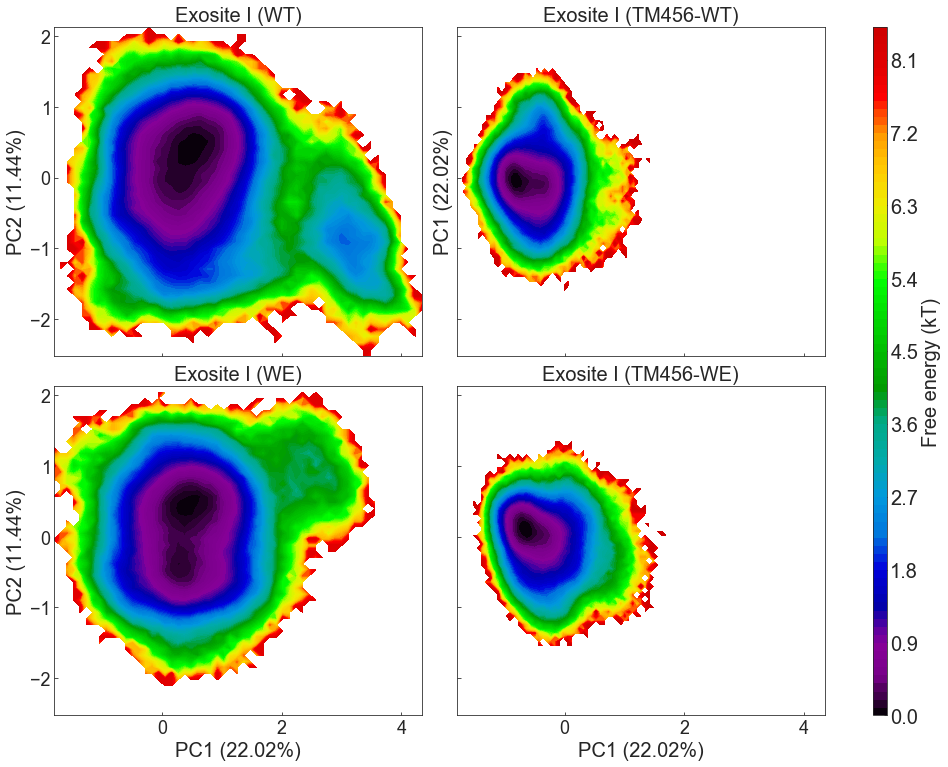

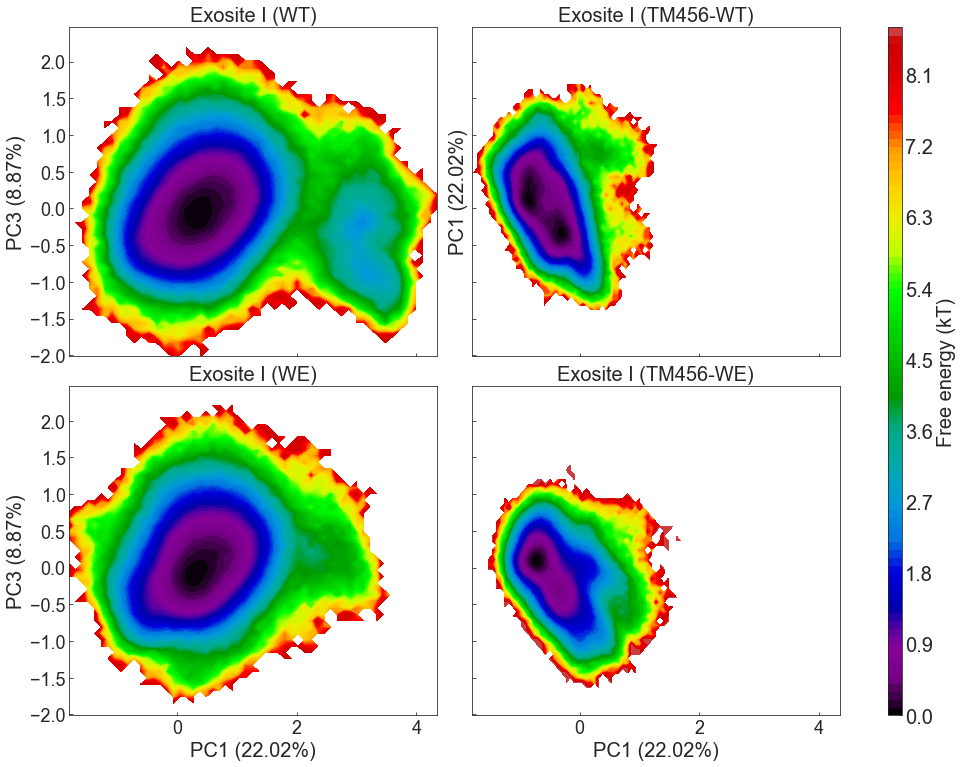

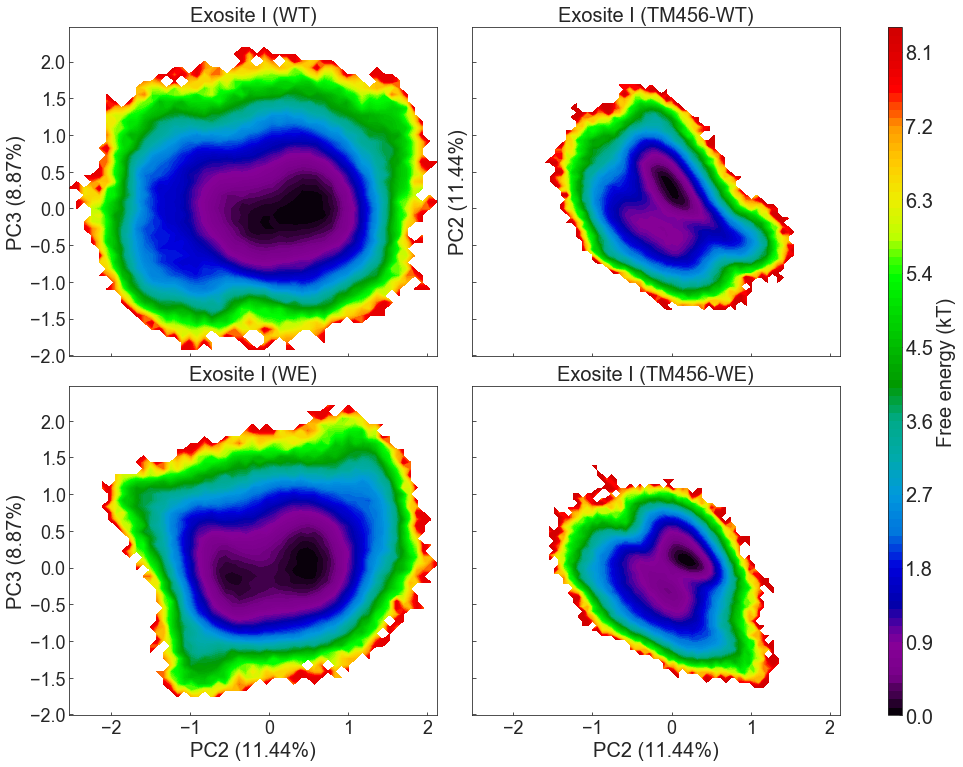

In [27]:
plot_free_energy(exositeI_pca,exositeI_variance,0,1,
                 frames_WT,frames_TM456_WT,frames_WE,frames_TM456_WE,
                 0,9,'Exosite I','exositeI')
plot_free_energy(exositeI_pca,exositeI_variance,0,2,
                 frames_WT,frames_TM456_WT,frames_WE,frames_TM456_WE,
                 0,9,'Exosite I','exositeI')
plot_free_energy(exositeI_pca,exositeI_variance,1,2,
                 frames_WT,frames_TM456_WT,frames_WE,frames_TM456_WE,
                 0,9,'Exosite I','exositeI')

In [28]:
# Exosite II
exositeII_pca=np.load(path+'pca/PcaBasisFromAll/exositeII/projection.npy')
exositeII_variance=np.load(path+'pca/PcaBasisFromAll/exositeII/variance.npy')

/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:19: RuntimeWarning: divide by zero encountered in log
/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:34: RuntimeWarning: divide by zero encountered in log
/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:48: RuntimeWarning: divide by zero encountered in log
/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:63: RuntimeWarning: divide by zero encountered in log
/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:86: MatplotlibDeprecationWarning: 
The set_clim function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use ScalarMappable.set_clim instead.
/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:19: RuntimeWarning: divide by zero encountered in log
/home/wud18/install/anaconda3/envs/

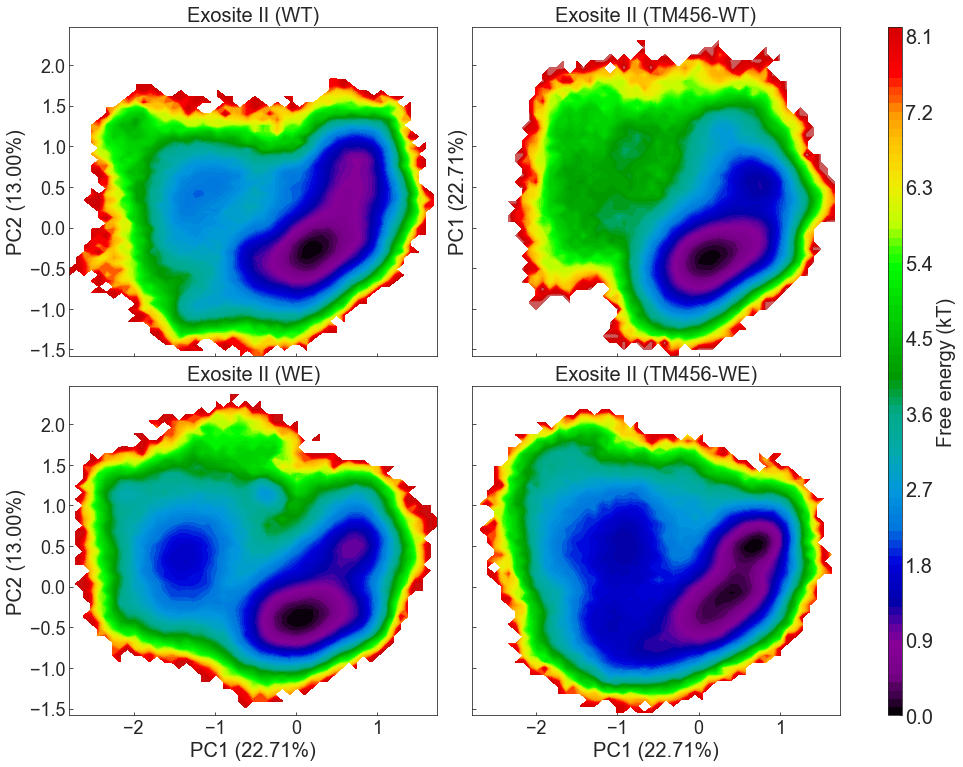

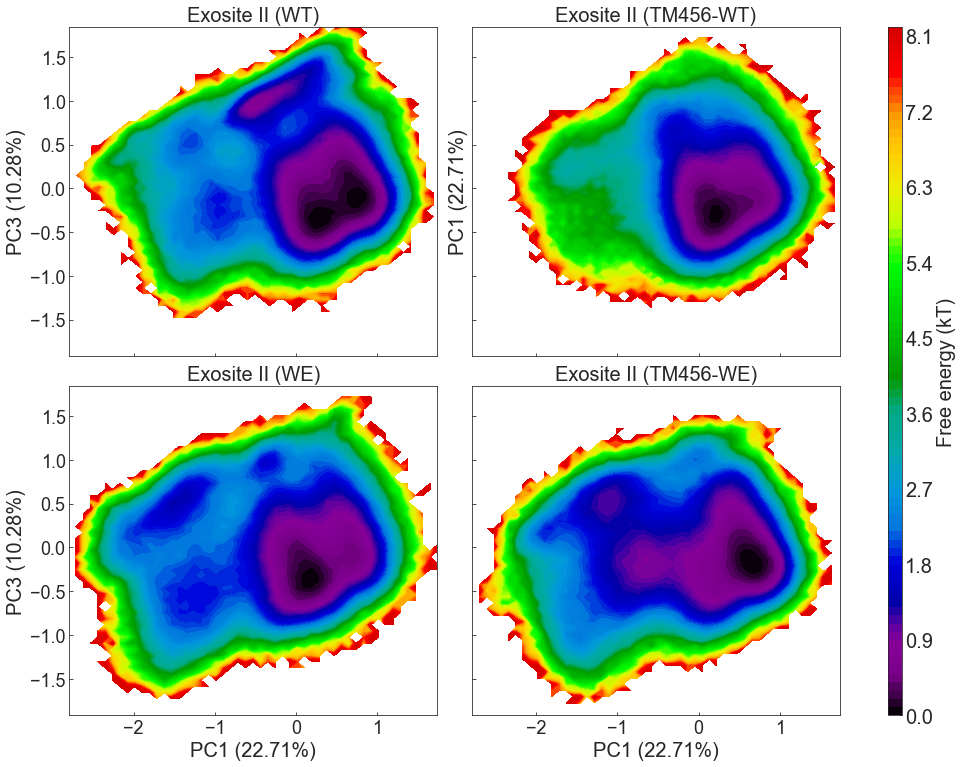

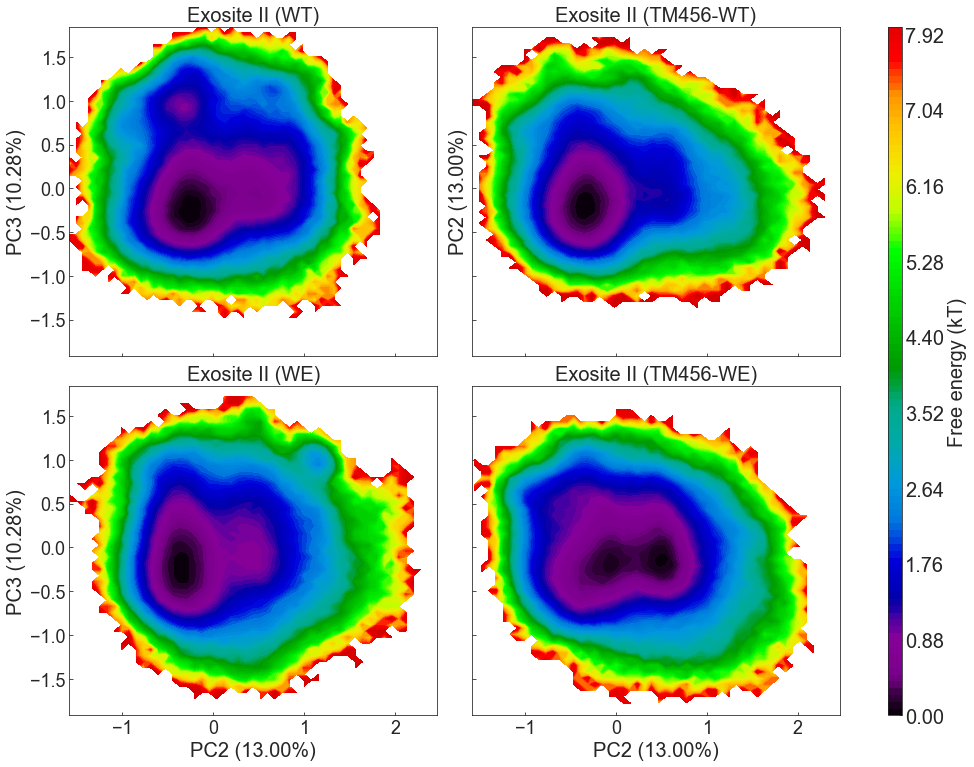

In [29]:
plot_free_energy(exositeII_pca,exositeII_variance,0,1,
                 frames_WT,frames_TM456_WT,frames_WE,frames_TM456_WE,
                 0,9,'Exosite II','exositeII')
plot_free_energy(exositeII_pca,exositeII_variance,0,2,
                 frames_WT,frames_TM456_WT,frames_WE,frames_TM456_WE,
                 0,9,'Exosite II','exositeII')
plot_free_energy(exositeII_pca,exositeII_variance,1,2,
                 frames_WT,frames_TM456_WT,frames_WE,frames_TM456_WE,
                 0,9,'Exosite II','exositeII')

In [30]:
# Connection (residue 167 to 170)
connection_pca=np.load(path+'pca/PcaBasisFromAll/connection/projection.npy')
connection_variance=np.load(path+'pca/PcaBasisFromAll/connection/variance.npy')

/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:19: RuntimeWarning: divide by zero encountered in log
/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:34: RuntimeWarning: divide by zero encountered in log
/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:48: RuntimeWarning: divide by zero encountered in log
/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:63: RuntimeWarning: divide by zero encountered in log
/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:86: MatplotlibDeprecationWarning: 
The set_clim function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use ScalarMappable.set_clim instead.
/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:19: RuntimeWarning: divide by zero encountered in log
/home/wud18/install/anaconda3/envs/

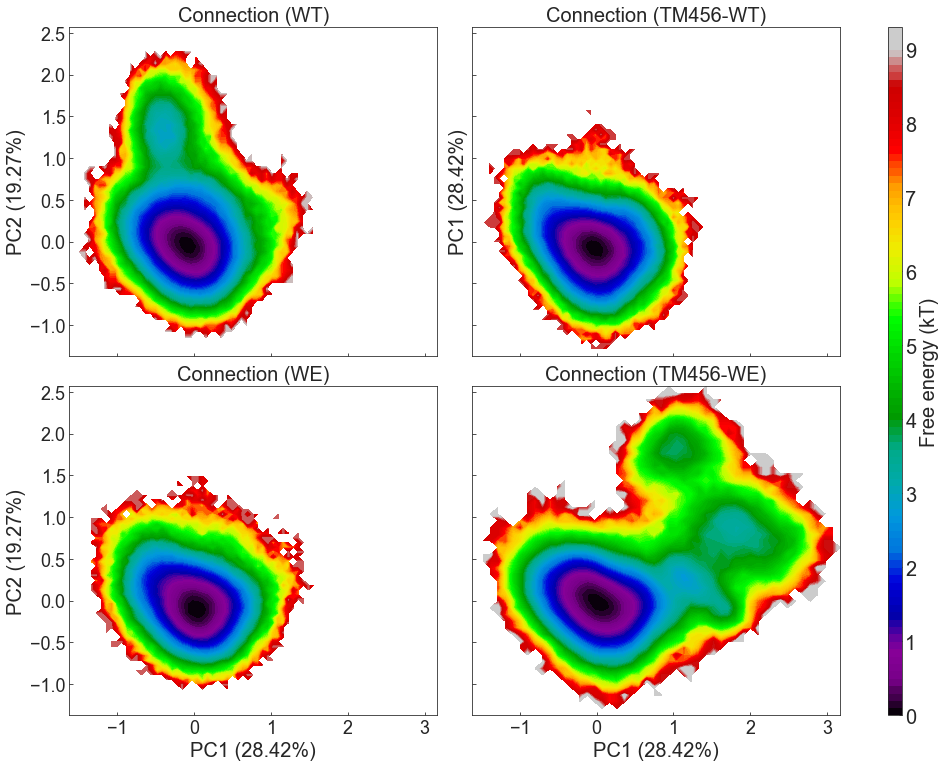

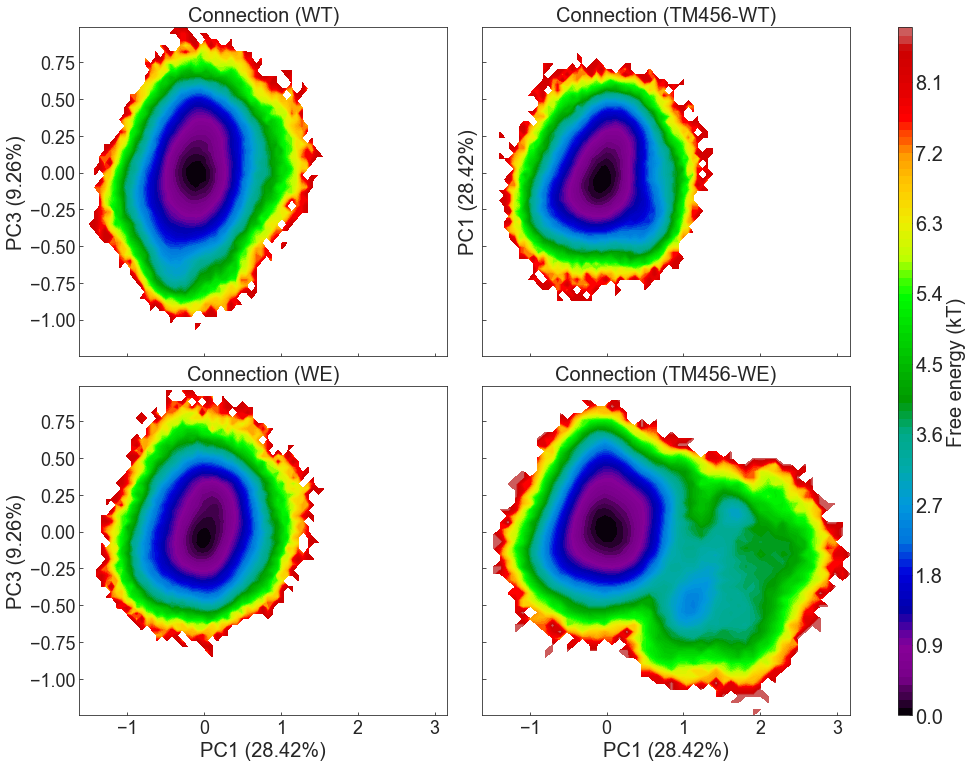

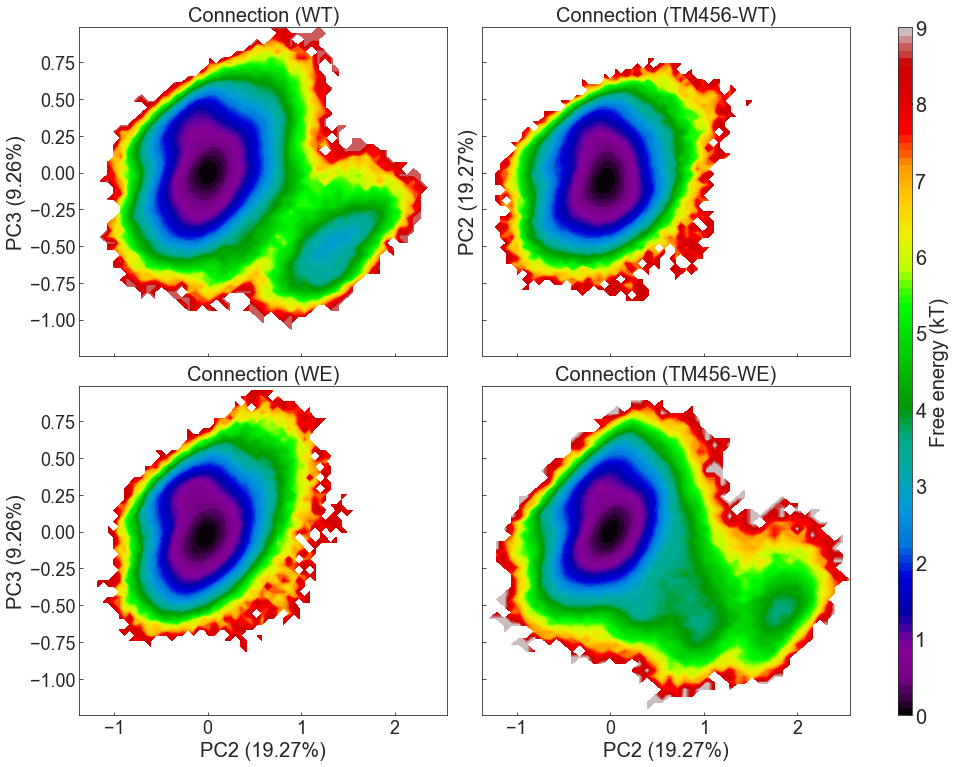

In [31]:
plot_free_energy(connection_pca,connection_variance,0,1,
                 frames_WT,frames_TM456_WT,frames_WE,frames_TM456_WE,
                 0,9,'Connection','connection')
plot_free_energy(connection_pca,connection_variance,0,2,
                 frames_WT,frames_TM456_WT,frames_WE,frames_TM456_WE,
                 0,9,'Connection','connection')
plot_free_energy(connection_pca,connection_variance,1,2,
                 frames_WT,frames_TM456_WT,frames_WE,frames_TM456_WE,
                 0,9,'Connection','connection')

In [32]:
# 30s Loop
thirtysLoop_pca=np.load(path+'pca/PcaBasisFromAll/30sLoop/projection.npy')
thirtysLoop_variance=np.load(path+'pca/PcaBasisFromAll/30sLoop/variance.npy')

/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:19: RuntimeWarning: divide by zero encountered in log
/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:34: RuntimeWarning: divide by zero encountered in log
/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:48: RuntimeWarning: divide by zero encountered in log
/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:63: RuntimeWarning: divide by zero encountered in log
/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:86: MatplotlibDeprecationWarning: 
The set_clim function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use ScalarMappable.set_clim instead.
/home/wud18/install/anaconda3/envs/py36/lib/python3.6/site-packages/ipykernel_launcher.py:19: RuntimeWarning: divide by zero encountered in log
/home/wud18/install/anaconda3/envs/

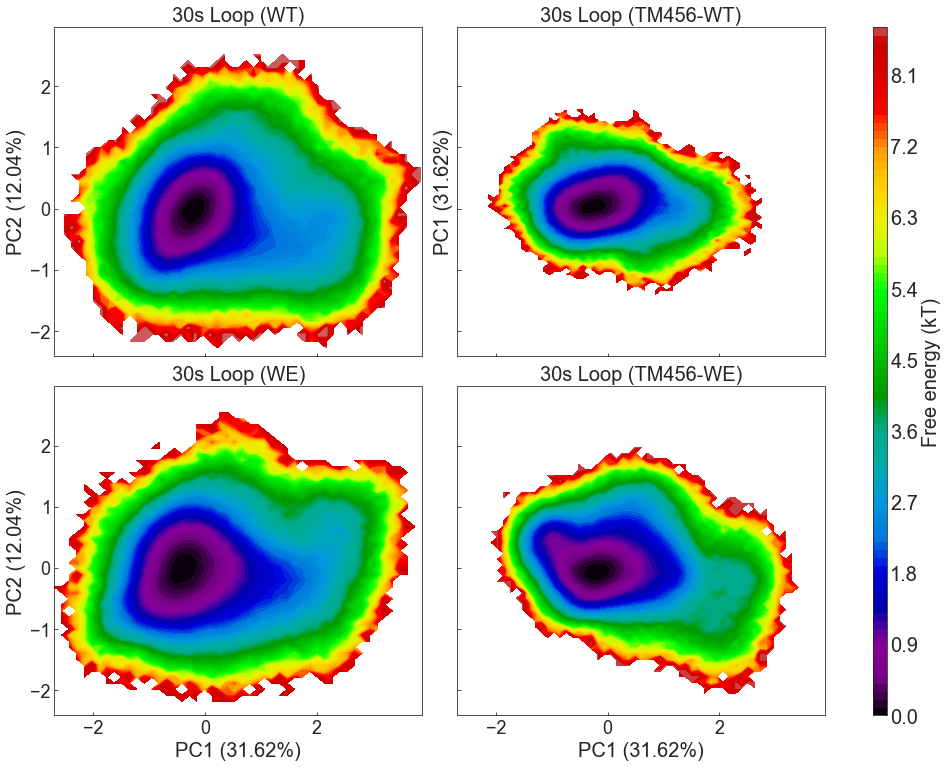

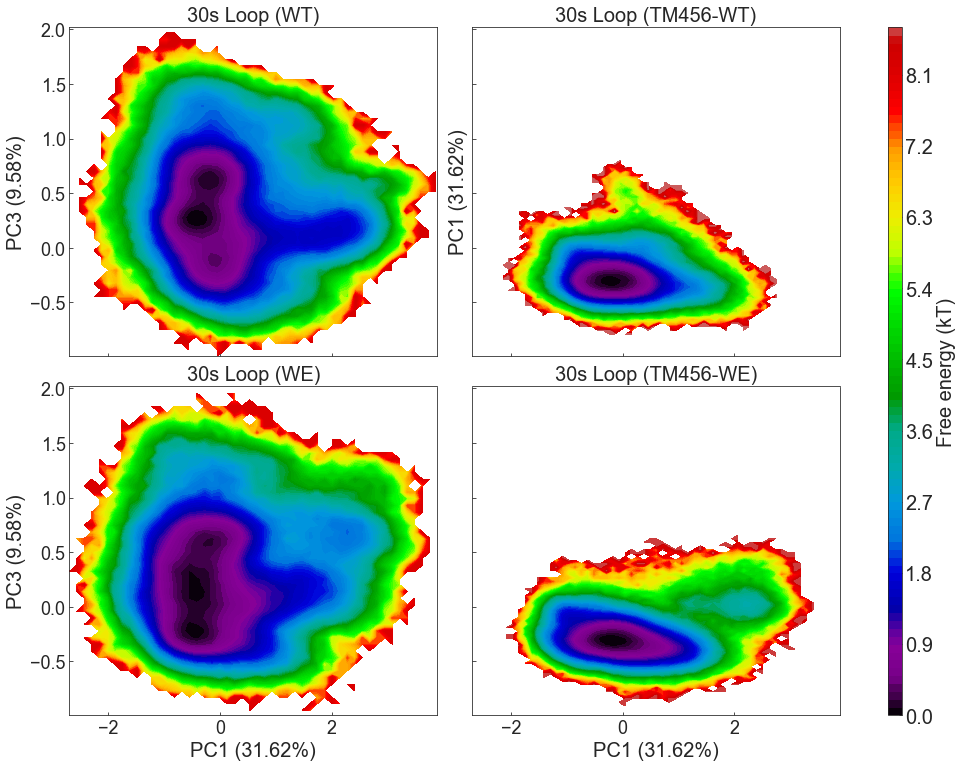

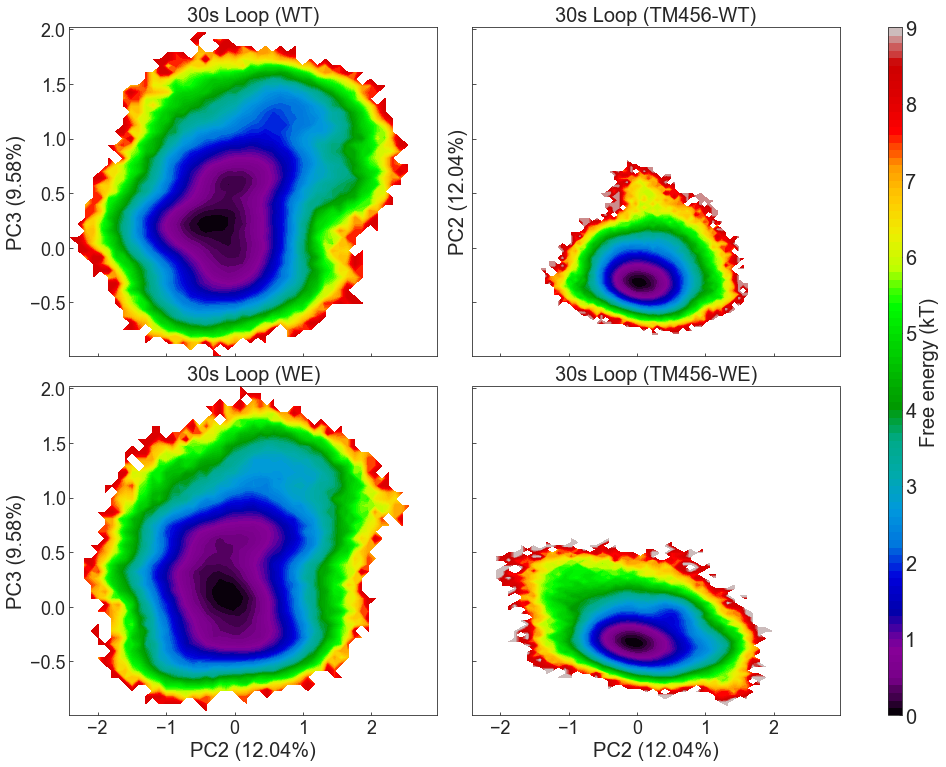

In [33]:
plot_free_energy(thirtysLoop_pca,thirtysLoop_variance,0,1,
                 frames_WT,frames_TM456_WT,frames_WE,frames_TM456_WE,
                 0,9,'30s Loop','30sLoop')
plot_free_energy(thirtysLoop_pca,thirtysLoop_variance,0,2,
                 frames_WT,frames_TM456_WT,frames_WE,frames_TM456_WE,
                 0,9,'30s Loop','30sLoop')
plot_free_energy(thirtysLoop_pca,thirtysLoop_variance,1,2,
                 frames_WT,frames_TM456_WT,frames_WE,frames_TM456_WE,
                 0,9,'30s Loop','30sLoop')

In [34]:
# Helix2 (residue 205 to 212)
helix2_pca=np.load(path+'pca/PcaBasisFromAll/helix2/projection.npy')
helix2_variance=np.load(path+'pca/PcaBasisFromAll/helix2/variance.npy')

FileNotFoundError: [Errno 2] No such file or directory: '/deac/phy/salsburyGrp/wud18/md/TM_mutant/pca/PcaBasisFromAll/helix2/projection.npy'

In [ ]:
plot_free_energy(helix2_pca,helix2_variance,0,1,
                 frames_bigger,frames_double,frames_outer,frames_inner,
                 0,9,'Helix2','helix2')
plot_free_energy(helix2_pca,helix2_variance,0,2,
                 frames_bigger,frames_double,frames_outer,frames_inner,
                 0,9,'Helix2','helix2')
plot_free_energy(helix2_pca,helix2_variance,1,2,
                 frames_bigger,frames_double,frames_outer,frames_inner,
                 0,9,'Helix2','helix2')

In [ ]:
# Beta Sheet1 (residue 171 to 176)
betaSheet1_pca=np.load(path+'pca/PcaBasisFromAll/betaSheet1/projection.npy')
betaSheet1_variance=np.load(path+'pca/PcaBasisFromAll/betaSheet1/variance.npy')

In [ ]:
plot_free_energy(betaSheet1_pca,betaSheet1_variance,0,1,
                 frames_bigger,frames_double,frames_outer,frames_inner,
                 0,9,'Beta Sheet1','betaSheet1')
plot_free_energy(betaSheet1_pca,betaSheet1_variance,0,2,
                 frames_bigger,frames_double,frames_outer,frames_inner,
                 0,9,'Beta Sheet1','betaSheet1')
plot_free_energy(betaSheet1_pca,betaSheet1_variance,1,2,
                 frames_bigger,frames_double,frames_outer,frames_inner,
                 0,9,'Beta Sheet1','betaSheet1')

In [ ]:
# Connection Beta Sheet1 (residue 167 to 176)
connectionBetaSheet1_pca=np.load(path+'pca/PcaBasisFromAll/connectionBetaSheet1/projection.npy')
connectionBetaSheet1_variance=np.load(path+'pca/PcaBasisFromAll/connectionBetaSheet1/variance.npy')

In [ ]:
plot_free_energy(connectionBetaSheet1_pca,connectionBetaSheet1_variance,0,1,
                 frames_bigger,frames_double,frames_outer,frames_inner,
                 0,9,'Connection Beta Sheet1','connectionBetaSheet1')
plot_free_energy(connectionBetaSheet1_pca,connectionBetaSheet1_variance,0,2,
                 frames_bigger,frames_double,frames_outer,frames_inner,
                 0,9,'Connection Beta Sheet1','connectionBetaSheet1')
plot_free_energy(connectionBetaSheet1_pca,connectionBetaSheet1_variance,1,2,
                 frames_bigger,frames_double,frames_outer,frames_inner,
                 0,9,'Connection Beta Sheet1','connectionBetaSheet1')

In [ ]:
# Helix1 Connection Beta Sheet1 (residue 158 to 176)
helix1ConnectionBetaSheet1_pca=np.load(path+'pca/PcaBasisFromAll/helix1ConnectionBetaSheet1/projection.npy')
helix1ConnectionBetaSheet1_variance=np.load(path+'pca/PcaBasisFromAll/helix1ConnectionBetaSheet1/variance.npy')

In [ ]:
plot_free_energy(helix1ConnectionBetaSheet1_pca,helix1ConnectionBetaSheet1_variance,0,1,
                 frames_bigger,frames_double,frames_outer,frames_inner,
                 0,9,'Helix1 Connection Beta Sheet1','helix1ConnectionBetaSheet1')
plot_free_energy(helix1ConnectionBetaSheet1_pca,helix1ConnectionBetaSheet1_variance,0,2,
                 frames_bigger,frames_double,frames_outer,frames_inner,
                 0,9,'Helix1 Connection Beta Sheet1','helix1ConnectionBetaSheet1')
plot_free_energy(helix1ConnectionBetaSheet1_pca,helix1ConnectionBetaSheet1_variance,1,2,
                 frames_bigger,frames_double,frames_outer,frames_inner,
                 0,9,'Helix1 Connection Beta Sheet1','helix1ConnectionBetaSheet1')